In [1]:
##################################
### Import the usual libraries ###
##################################

### Numpy
import numpy as np

### Astropy
import astropy

#Astropy FITS/Table handling
from astropy.io import fits, ascii
from astropy.table import Table, Column

#astropy coorindates/units
from astropy.coordinates import SkyCoord
import astropy.constants as const
import astropy.units as u

### Pandas
# import pandas as pd

### Matplotlib
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 18}) #make plots more readable
import matplotlib.patches as mpatches
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator
from matplotlib.offsetbox import AnchoredText

# ### Yumi's RA/DEC ---> Magellanic Stream Coorindates
# import MagellanicStream as ms

# ### Functions used in this code
# import age_functions as afunc

## Stuff Writtten by A Really Cool Professor
import dlnpyutils as dlpu

###
import linearfitting as linfit
import geometry as geo

import mlefitting as mlefit
import olsfitting as olsfit
import utilities as util

### Other
import warnings
warnings.filterwarnings('ignore')

from tqdm import tqdm_notebook

### Age of Universe
H0 = 74.03*(u.km/u.s)/u.Mpc
hertz = H0.to(u.km/u.s/u.pc).to(u.km/u.s/u.km)
tage = (1/hertz).to(u.yr)
ageU = tage.value

In [2]:
#######################
### Import SMC Data ###
#######################

#total number 1225
smc = fits.getdata('/Users/joshpovick/Desktop/Research/SMC_Gradients/smc_rgbmembers.r13-l33-58932beta.fits.gz') 

cln = np.where((smc['FE_H']>-9999.0)&(smc['AK_TARG']>-9999.0)&(smc['LOGG']>0.0)&
               (smc['FE_H_ERR']>-90.0)&(smc['C_FE']>-9999.0)&(smc['N_FE']>-9999.0))

#total number 990
smc = smc[cln]

## Find Bloop
bloop = np.where((smc['H']<=13.25)&(smc['J']-smc['K']<=0.95)&(smc['TEFF']>=4175))
bloop_cut = []
for i in range(len(smc)):
    if i not in np.squeeze(bloop).tolist():
        bloop_cut.append(i)
        
smc_nobloop = smc[bloop_cut]

In [46]:
#########################
### Import Isochrones ###
#########################

parsecall = ascii.read('/Users/joshpovick/Desktop/Research/SMC_Gradients/parsec3_3.dat', \
                    format='basic', delimiter='\s')

parsec = parsecall[np.where(parsecall['label']==3)]

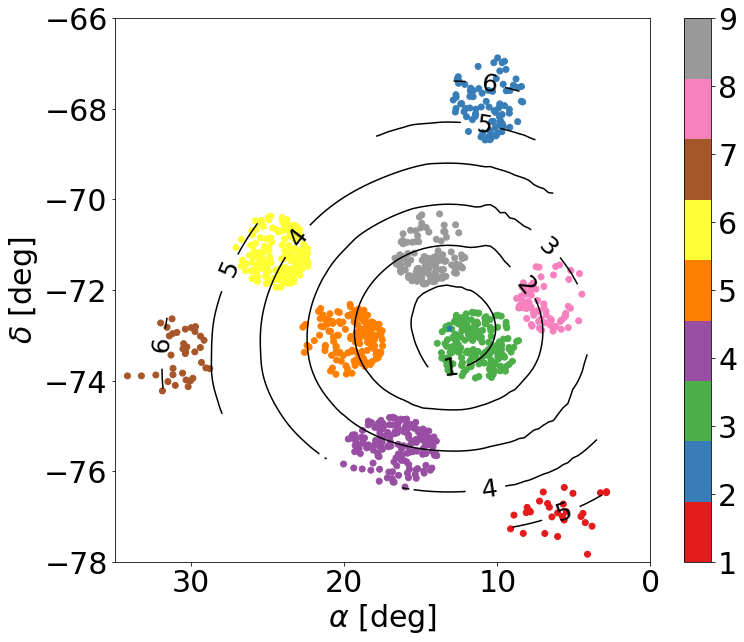

In [3]:
################
### SMC Map ###
###############

### Map

from scipy.interpolate import griddata

radius = smc['SMCRAD']*1.05

xx,yy = np.meshgrid(np.linspace(np.min(smc['RA']),np.max(smc['RA']),100),
                    np.linspace(np.min(smc['DEC']),np.max(smc['DEC']),100))

points = np.array([smc['RA'],smc['DEC']]).T

grid_z0 = griddata(points, radius, (xx, yy), method='cubic')

field_color = []
for i in range(len(smc)):
    if smc['FIELD'][i] == '47TUC':
        field_color.append(8.0)
    if smc['FIELD'][i] == 'N362':
        field_color.append(9.0)
    if smc['FIELD'][i] == 'SMC1':
        field_color.append(1.0)
    if smc['FIELD'][i] == 'SMC2':
        field_color.append(2.0)
    if smc['FIELD'][i] == 'SMC3':
        field_color.append(3.0)
    if smc['FIELD'][i] == 'SMC4':
        field_color.append(4.0)
    if smc['FIELD'][i] == 'SMC5':
        field_color.append(5.0)
    if smc['FIELD'][i] == 'SMC6':
        field_color.append(6.0)
    if smc['FIELD'][i] == 'SMC7':
        field_color.append(7.0)

matplotlib.rcParams.update({'font.size': 30})
# plt.figure(figsize=[12,12])

fig, ax = plt.subplots(figsize=[12,10])

plt.scatter(smc['RA'],smc['DEC'],c=field_color,cmap='Set1')
plt.colorbar()

plt.scatter(13.18333333,-72.82833333,marker='*')

plt.xlim(0,35)
plt.ylim(-78,-66)

plt.gca().invert_xaxis()
# plt.gca().invert_yaxis()

CS = plt.contour(xx,yy,grid_z0*1.05,levels=[1,2,3,4,5,6],colors='k')
plt.clabel(CS,fmt='%2.1d',colors='k',fontsize=25)#,manual=locations)

# plt.xticks([-8,-4.0,0,4.0,8])
# plt.yticks([-8,-4.0,0,4.0,8])

plt.xlabel(r'$\alpha$ [deg]')
plt.ylabel(r'$\delta$ [deg]')

# plt.savefig('SmcGeometry.pdf',bbox_inches='tight')
plt.show()

In [4]:
####################################
### Gaia Query Using Online Form ###
####################################

# (00:52:44, −72:49:42) Used in SMASH
center = SkyCoord('00:52:44 -72:49:42', unit=(u.hourangle, u.deg))

print('''Cone search center: {} with radius 6.5 deg'''.format(center))

smc_gaia = fits.getdata('smc_apogee-result.fits.gz')
cln = np.where((smc_gaia['astrometric_excess_noise']<1.0)&(np.isfinite(smc_gaia['phot_g_mean_mag'])==True)&
               (np.isfinite(smc_gaia['phot_g_mean_mag'])==True)&(np.isfinite(smc_gaia['phot_bp_mean_mag'])==True)&
               (np.isfinite(smc_gaia['phot_rp_mean_mag'])==True)&(smc_gaia['parallax']<0.2)&
               (smc_gaia['parallax']>-0.2)&(smc_gaia['pmra']>=-3.0)&(smc_gaia['pmra']<=3.0)&
               (smc_gaia['pmdec']>=-3.0)&(smc_gaia['pmdec']<=3.0)&(smc_gaia['phot_g_mean_flux_over_error']>5.0)&
               (smc_gaia['phot_bp_mean_flux_over_error']>5.0)&(smc_gaia['phot_rp_mean_flux_over_error']>5.0))
smc_gaia = smc_gaia[cln]

# cuts from  

# @ARTICLE{2020MNRAS.tmp.3030O,
#        author = {{Omkumar}, Abinaya O. and {Subramanian}, Smitha and
#          {Niederhofer}, Florian and {Diaz}, Jonathan and {Cioni}, Maria-Rosa L. and
#          {El Youssoufi}, Dalal and {Bekki}, Kenji and {de Grijs}, Richard and
#          {van Loon}, Jacco Th},
#         title = "{Gaia view of a stellar sub-structure in front of the Small Magellanic Cloud}",
#       journal = {\mnras},
#      keywords = {Magellanic Clouds, galaxies: interactions, proper motions, stars: kinematics and dynamics, Astrophysics - Astrophysics of Galaxies},
#          year = 2020,
#         month = oct,
#           doi = {10.1093/mnras/staa3085},
# archivePrefix = {arXiv},
#        eprint = {2010.02687},
#  primaryClass = {astro-ph.GA},
#        adsurl = {https://ui.adsabs.harvard.edu/abs/2020MNRAS.tmp.3030O},
#       adsnote = {Provided by the SAO/NASA Astrophysics Data System}
# }

Cone search center: <SkyCoord (ICRS): (ra, dec) in deg
    (13.18333333, -72.82833333)> with radius 6.5 deg


In [5]:
smc_gaia.columns

ColDefs(
    name = 'solution_id'; format = 'K'
    name = 'designation'; format = '28A'
    name = 'source_id'; format = 'K'
    name = 'random_index'; format = 'K'
    name = 'ref_epoch'; format = 'D'; unit = 'yr'
    name = 'ra'; format = 'D'; unit = 'deg'
    name = 'ra_error'; format = 'D'; unit = 'mas'
    name = 'dec'; format = 'D'; unit = 'deg'
    name = 'dec_error'; format = 'D'; unit = 'mas'
    name = 'parallax'; format = 'D'; unit = 'mas'
    name = 'parallax_error'; format = 'D'; unit = 'mas'
    name = 'parallax_over_error'; format = 'E'
    name = 'pmra'; format = 'D'; unit = 'mas.yr**-1'
    name = 'pmra_error'; format = 'D'; unit = 'mas.yr**-1'
    name = 'pmdec'; format = 'D'; unit = 'mas.yr**-1'
    name = 'pmdec_error'; format = 'D'; unit = 'mas.yr**-1'
    name = 'ra_dec_corr'; format = 'E'
    name = 'ra_parallax_corr'; format = 'E'
    name = 'ra_pmra_corr'; format = 'E'
    name = 'ra_pmdec_corr'; format = 'E'
    name = 'dec_parallax_corr'; format = 'E'
    na

<font size='40'>
    <b>
        Reduced Proper Motion
    </b>
</font>

# Color Magnitude Diagrams

In [6]:
smc_nobloop.columns

ColDefs(
    name = 'APSTAR_ID'; format = '46A'
    name = 'TARGET_ID'; format = '36A'
    name = 'ASPCAP_ID'; format = '48A'
    name = 'FILE'; format = '34A'
    name = 'APOGEE_ID'; format = '18A'
    name = 'TELESCOPE'; format = '6A'
    name = 'LOCATION_ID'; format = 'J'
    name = 'FIELD'; format = '5A'
    name = 'J'; format = 'E'
    name = 'J_ERR'; format = 'E'
    name = 'H'; format = 'E'
    name = 'H_ERR'; format = 'E'
    name = 'K'; format = 'E'
    name = 'K_ERR'; format = 'E'
    name = 'RA'; format = 'D'
    name = 'DEC'; format = 'D'
    name = 'GLON'; format = 'D'
    name = 'GLAT'; format = 'D'
    name = 'APOGEE_TARGET1'; format = 'J'
    name = 'APOGEE_TARGET2'; format = 'J'
    name = 'APOGEE_TARGET3'; format = 'J'
    name = 'APOGEE2_TARGET1'; format = 'J'
    name = 'APOGEE2_TARGET2'; format = 'J'
    name = 'APOGEE2_TARGET3'; format = 'J'
    name = 'TARGFLAGS'; format = '45A'
    name = 'SURVEY'; format = '8A'
    name = 'PROGRAMNAME'; format = '10A'
    name 

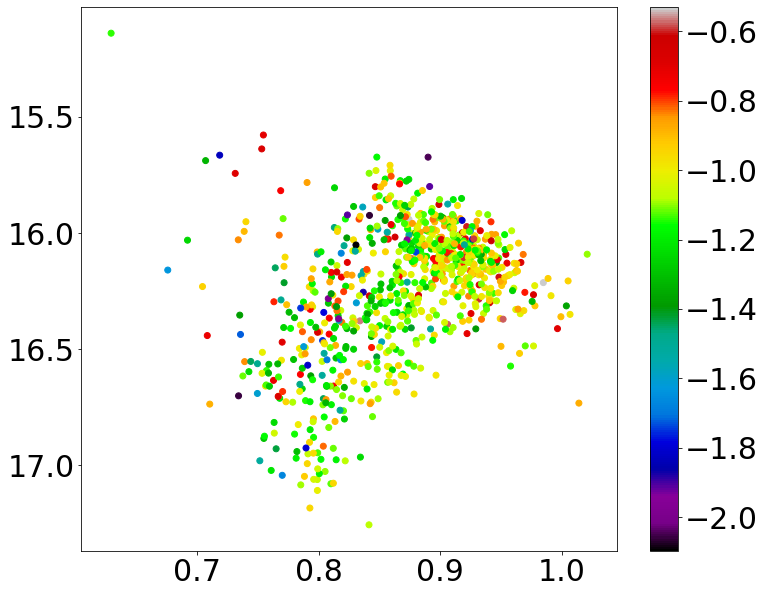

In [7]:
plt.figure(figsize=[12,10])
plt.scatter(smc_nobloop['GAIA_GMAG']-smc_nobloop['GAIA_RPMAG'],smc_nobloop['GAIA_GMAG'],c=smc_nobloop['FE_H'],
            cmap='nipy_spectral')
# plt.errorbar(smc_nobloop['GAIA_GMAG']-smc_nobloop['GAIA_RPMAG'],smc_nobloop['GAIA_GMAG'],c='grey',
#              yerr=smc_nobloop['GAIA_GMAG_ERR'],
#              xerr=np.sqrt(smc_nobloop['GAIA_RPMAG_ERR']**2+smc_nobloop['GAIA_RPMAG_ERR']**2),ls='none')
plt.gca().invert_yaxis()
plt.colorbar()

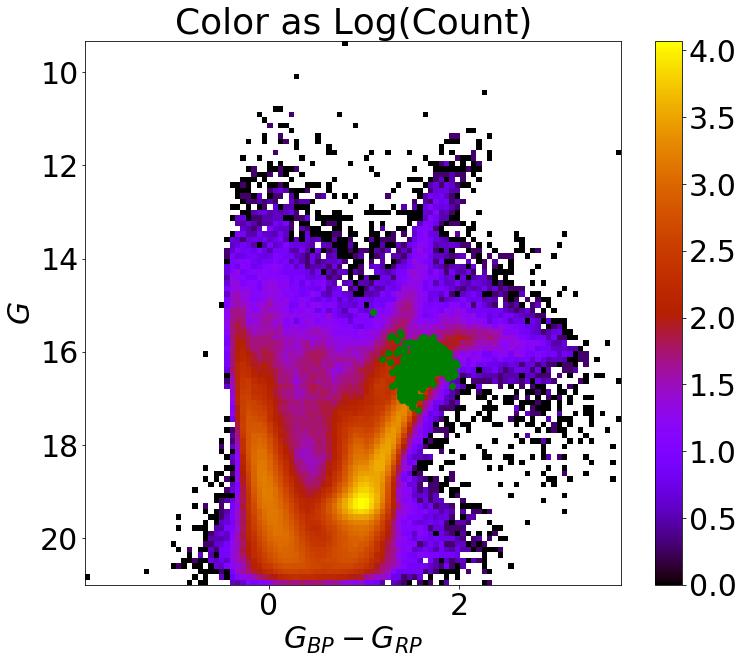

In [8]:
from scipy.stats import binned_statistic_2d
N = binned_statistic_2d(x=smc_gaia['bp_rp'],y=smc_gaia['phot_g_mean_mag'],
                        values=smc_gaia['bp_rp'],statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(N.statistic.T),origin='lower',
           extent=[N.x_edge[0],N.x_edge[-1],N.y_edge[0],N.y_edge[-1]],aspect='auto',
           interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.scatter(smc_nobloop['GAIA_BPMAG']-smc_nobloop['GAIA_RPMAG'],smc_nobloop['GAIA_GMAG'],c='green')

plt.gca().invert_yaxis()

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$G_{BP} - G_{RP}$')
plt.ylabel(r'$G$')

# plt.savefig('CMDWithGaia.pdf',bbox_inches='tight')

plt.show()

In [9]:
rc_cut = np.where((smc_gaia['bp_rp']>0.65)&(smc_gaia['bp_rp']<1.25)&(smc_gaia['phot_g_mean_mag']>18.8)
                  &(smc_gaia['phot_g_mean_mag']<19.7))
rc_gaia = smc_gaia[rc_cut]

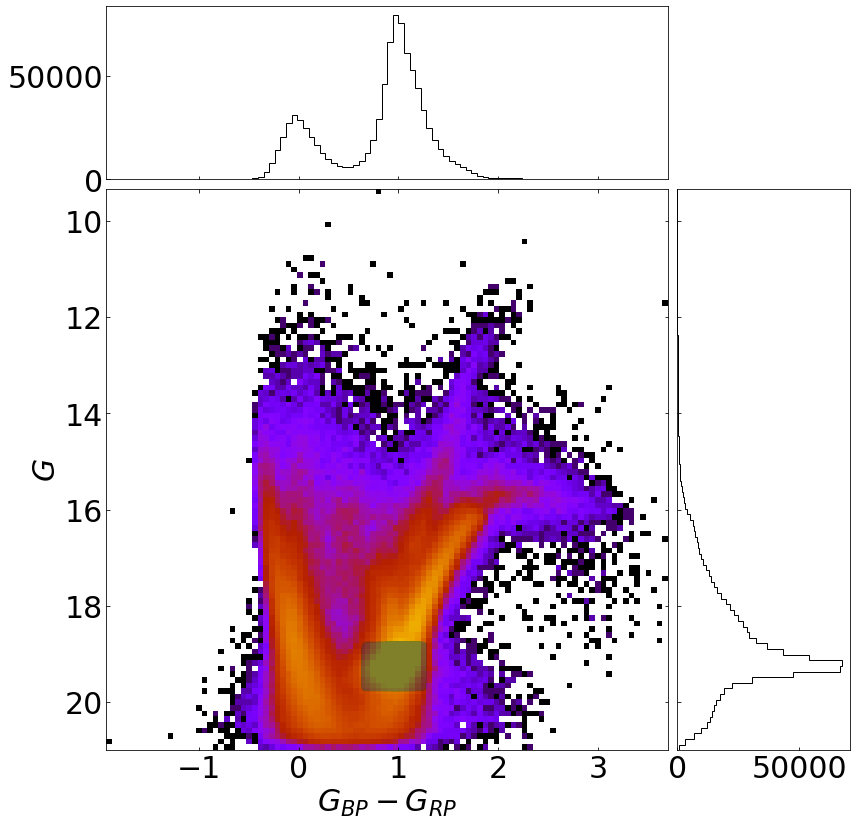

In [10]:
# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
spacing = 0.011

rect_image = [left, bottom, width, height]
rect_histx = [left, bottom + height + spacing, width, 0.2]
rect_histy = [left + width + spacing, bottom, 0.2, height]

# start with a rectangular Figure
plt.figure(figsize=(12, 12))

ax_image = plt.axes(rect_image)
ax_image.tick_params(direction='in', top=True, right=True)
ax_histx = plt.axes(rect_histx)
ax_histx.tick_params(direction='in', labelbottom=False)
ax_histy = plt.axes(rect_histy)
ax_histy.tick_params(direction='in', labelleft=False) 

# the image plot:
ax_image.imshow(np.log10(N.statistic.T),origin='lower',
           extent=[N.x_edge[0],N.x_edge[-1],N.y_edge[0],N.y_edge[-1]],aspect='auto',
           interpolation='nearest',cmap='gnuplot')
# ax_image.scatter(0.96,19.275,marker='*')
ax_image.scatter(rc_gaia['bp_rp'],rc_gaia['phot_g_mean_mag'],alpha=0.01,c='gray')
ax_image.invert_yaxis()
ax_image.set_xlabel(r'$G_{BP} - G_{RP}$')
ax_image.set_ylabel(r'$G$')

bins = 100
ax_histx.hist(smc_gaia['bp_rp'], bins=bins,histtype='step',color='k')
ax_histy.hist(smc_gaia['phot_g_mean_mag'], bins=bins,histtype='step',orientation='horizontal',color='k')
ax_histy.invert_yaxis()

ax_histx.set_xlim(ax_image.get_xlim())
ax_histy.set_ylim(ax_image.get_ylim())

plt.show()

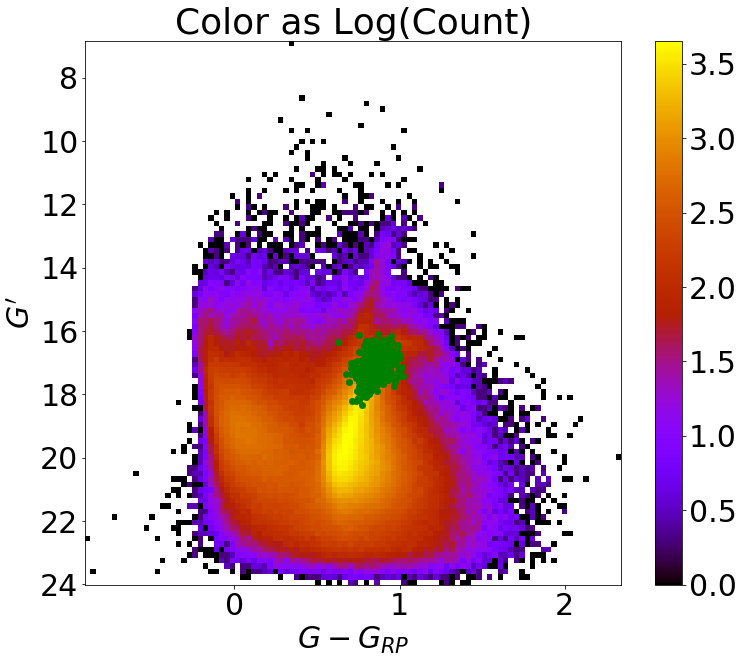

In [11]:
Gp = smc_gaia['phot_g_mean_mag'] + 5*np.log10(np.sqrt((smc_gaia['pmra'])**2+(smc_gaia['pmdec'])**2))
smc_Gp = smc_nobloop['GAIA_GMAG'] + 5*np.log10(np.sqrt((smc_nobloop['GAIA_PMRA'])**2+
                                                       (smc_nobloop['GAIA_PMDEC'])**2))

fin_Gp = np.where(np.isfinite(Gp)==True)

Np = binned_statistic_2d(x=smc_gaia[fin_Gp]['g_rp'],y=Gp[fin_Gp],
                        values=smc_gaia[fin_Gp]['g_rp'],statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Np.statistic.T),origin='lower',
           extent=[Np.x_edge[0],Np.x_edge[-1],Np.y_edge[0],Np.y_edge[-1]],aspect='auto',
           interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.scatter(smc_nobloop['GAIA_GMAG']-smc_nobloop['GAIA_RPMAG'],smc_Gp,c='green')

plt.gca().invert_yaxis()

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$G - G_{RP}$')
plt.ylabel(r'$G^\prime$')
plt.savefig('reducedpmplot.pdf' )
plt.show()

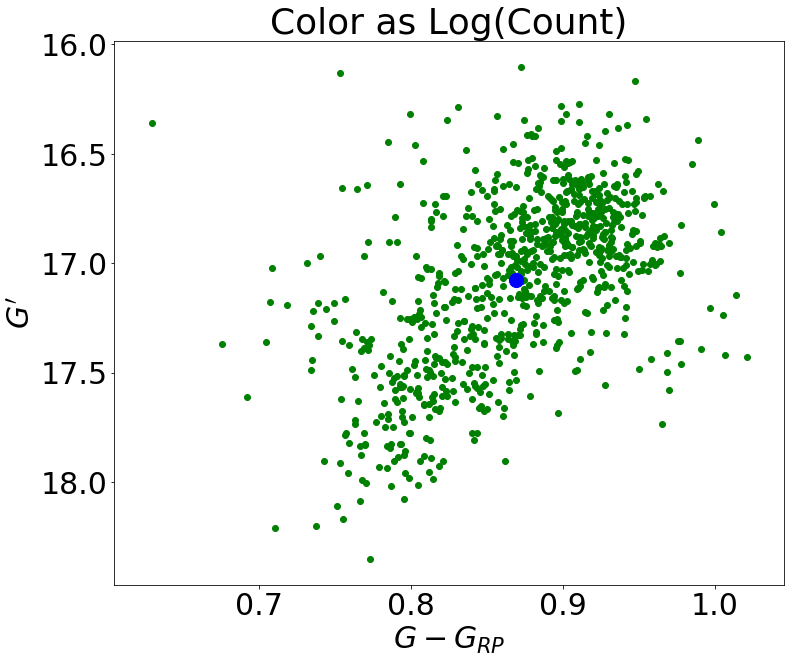

In [12]:
smc_Gp = smc_nobloop['GAIA_GMAG'] + 5*np.log10(np.sqrt((smc_nobloop['GAIA_PMRA'])**2+
                                                       (smc_nobloop['GAIA_PMDEC'])**2))

# fin_Gp = np.where(np.isfinite(Gp)==True)

# Np = binned_statistic_2d(x=smc_gaia[fin_Gp]['bp_rp'],y=Gp[fin_Gp],
#                         values=smc_gaia[fin_Gp]['bp_rp'],statistic='count',bins=100)

plt.figure(figsize=[12,10])
# plt.imshow(np.log10(Np.statistic.T),origin='lower',
#            extent=[Np.x_edge[0],Np.x_edge[-1],Np.y_edge[0],Np.y_edge[-1]],aspect='auto',
#            interpolation='nearest',cmap='gnuplot')
# plt.colorbar()

plt.scatter(smc_nobloop['GAIA_GMAG']-smc_nobloop['GAIA_RPMAG'],smc_Gp,c='green')
plt.scatter(np.mean(smc_nobloop['GAIA_GMAG']-smc_nobloop['GAIA_RPMAG']),np.mean(smc_Gp),c='b',s=200)

plt.gca().invert_yaxis()

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$G - G_{RP}$')
plt.ylabel(r'$G^\prime$')
# plt.savefig('reducedpmplot.pdf' )
plt.show()

# Kinematic Distances

Kinemtaic distance can be calculated with $d = d_{0}\frac{\mu_0}{\mu}\frac{v_r}{v_{r0}}\frac{\tan{\phi}}{\tan{\phi_0}}$. Where $d_0 = \frac{v_{r0}\tan{\phi_0}}{4.74\mu_0^{\prime\prime}}$ and $d = \frac{v_{r}\tan{\phi}}{4.74\mu^{\prime\prime}}$

In [155]:
def pm_equ2gal(pmra,pmdec,ra,dec):
    '''
    Convert pmra and pmdec to galactic coordinates
    
    Inputs:
    ------
        pmra: proper motion in ra ($\mu_{\alpha}\cos{\delta}$)
        pmdec: proper motion in dec
        ra: right ascension
        dec: declination
    
    Outputs:
    -------
        pml: proper motion in galactic longitude
        pmb: proper motion in galactic latitude
    '''
    alpg = np.radians(192.85948)
    delg = np.radians(27.12825)
    
    c1 = np.sin(delg)*np.cos(dec)-np.cos(delg)*np.sin(dec)*np.cos(ra-alpg)
    c2 = np.cos(delg)*np.sin(ra-alpg)
    cb = np.sqrt(c1**2+c2**2)
    
    pml = []
    pmb = []
    for i in range(len(pmra)):
        
        rot = np.array([[c1[i],c2[i]],[-c2[i],c1[i]]])/cb[i]
        
        transform = np.dot(rot,np.array([pmra[i],pmdec[i]]))
        
        pml.append(transform[0])
        pmb.append(transform[1])
    
    return pml,pmb

In [156]:
pml,pmb=pm_equ2gal(smc_nobloop['GAIA_PMRA'],smc_nobloop['GAIA_PMDEC'],smc_nobloop['RA'],smc_nobloop['DEC'])

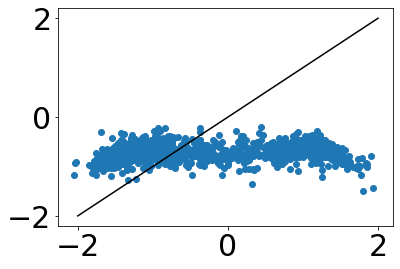

In [159]:
smc_nobloop.columns

plt.scatter(pml,smc_nobloop['GAIA_PML'])
plt.plot([-2,2],[-2,2],c='k')

In [130]:
vec = []
u_vec = []
for i in range(len(smc_nobloop)):
    a = np.array([smc_nobloop['GAIA_PMRA'][i],smc_nobloop['GAIA_PMDEC'][i]])
    vec.append(a)
    u_vec.append(a/np.linalg.norm(a))

In [ ]:
plt.

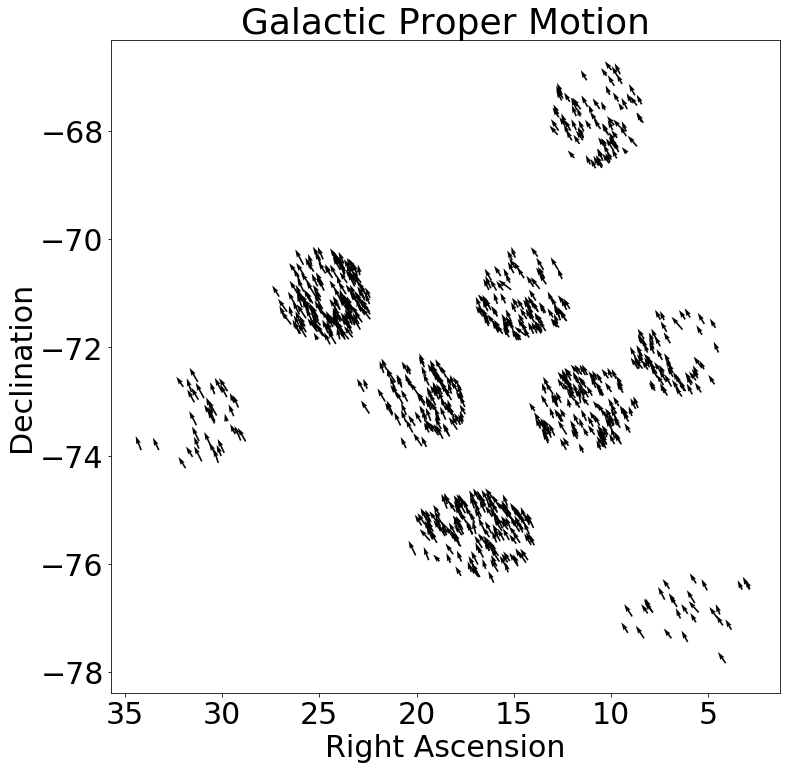

In [14]:
mean_pmra = np.mean(smc_nobloop['GAIA_PMRA'])
mean_pmdec = np.mean(smc_nobloop['GAIA_PMDEC'])

plt.figure(figsize=[12,12])
plt.quiver(smc_nobloop['RA'],smc_nobloop['DEC'],
           smc_nobloop['GAIA_PML'],smc_nobloop['GAIA_PMB'])
plt.gca().invert_xaxis()

plt.xlabel(r'Right Ascension')
plt.ylabel(r'Declination')
plt.title(r'Galactic Proper Motion')

plt.show()

# plt.figure(figsize=[12,12])
# plt.quiver(smc_nobloop['RA'],smc_nobloop['DEC'],
#            smc_nobloop['GAIA_PMML']-mean_pmra,smc_nobloop['GAIA_PMMB']-mean_pmdec)
# plt.gca().invert_xaxis()

# plt.show()

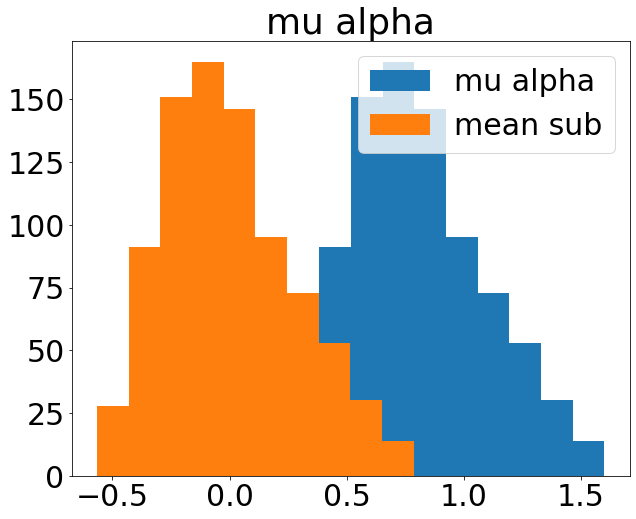

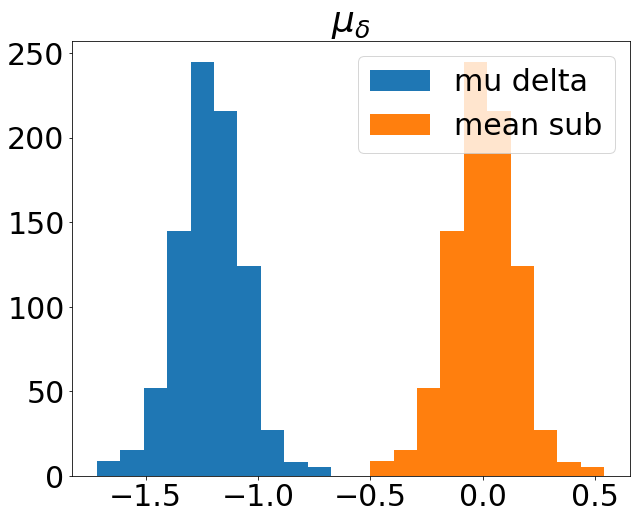

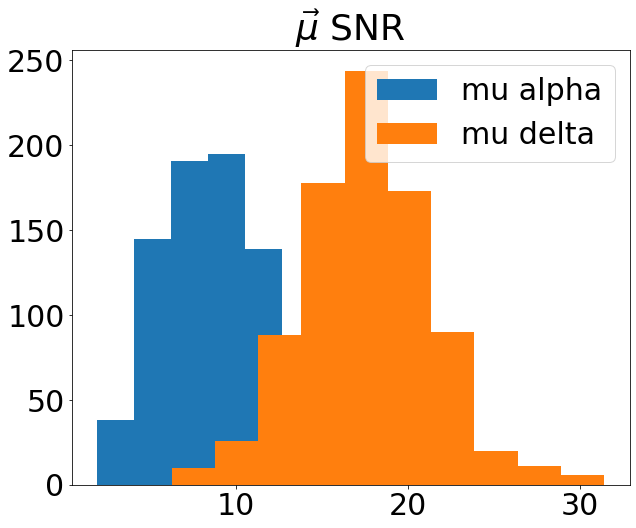

In [15]:
plt.figure(figsize=[10,8])
plt.hist(smc_nobloop['GAIA_PMRA'],label='mu alpha')
plt.hist(smc_nobloop['GAIA_PMRA']-mean_pmra,label='mean sub')
plt.title(r'mu alpha')
plt.legend()
plt.show()

plt.figure(figsize=[10,8])
plt.hist(smc_nobloop['GAIA_PMDEC'],label='mu delta')
plt.hist(smc_nobloop['GAIA_PMDEC']-mean_pmdec,label='mean sub')
plt.title(r'$\mu_{\delta}$')
plt.legend()
plt.show()

plt.figure(figsize=[10,8])
plt.hist(smc_nobloop['GAIA_PMRA']/smc_nobloop['GAIA_PMRA_ERROR'],label='mu alpha')
plt.hist(np.abs(smc_nobloop['GAIA_PMDEC']/smc_nobloop['GAIA_PMDEC_ERROR']),label='mu delta')
plt.title(r'$\vec{\mu}$ SNR')
plt.legend()
plt.show()

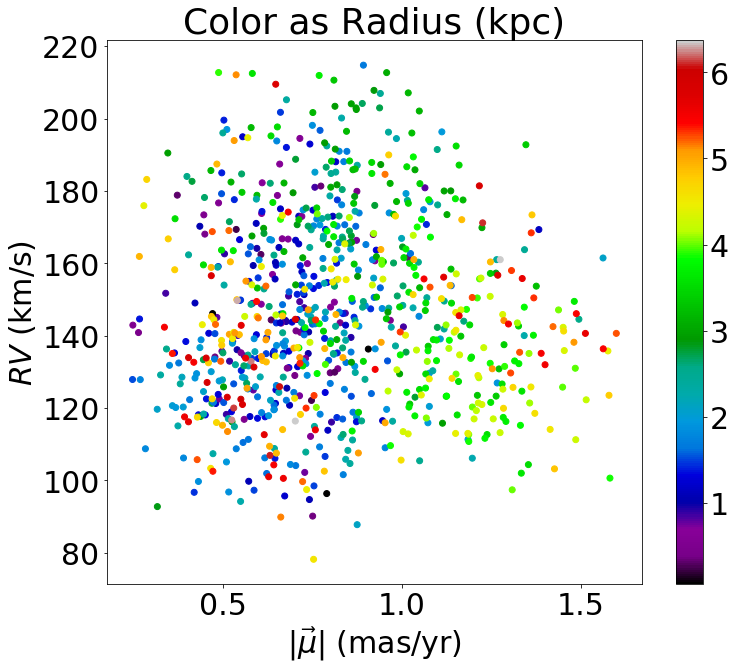

In [16]:
plt.figure(figsize=[12,10])
plt.scatter(np.sqrt(smc_nobloop['GAIA_PMRA']**2,smc_nobloop['GAIA_PMDEC']**2),
            smc_nobloop['VHELIO_AVG'],c=smc_nobloop['SMCRAD']*1.05,cmap='nipy_spectral')
plt.colorbar()

plt.title(r'Color as Radius (kpc)')
plt.xlabel(r'$|\vec{\mu}|$ (mas/yr)')
plt.ylabel(r'$RV$ (km/s)')

plt.show()

### FIELD by field

(array([  1251.,   3317.,  14841.,  78814., 280677., 345032., 104500.,
         36109.,  16206.,   4527.]),
 array([-9.34909759, -4.84284554, -0.33659349,  4.16965856,  8.67591061,
        13.18216266, 17.68841471, 22.19466676, 26.70091881, 31.20717086,
        35.71342291]),
 <a list of 10 Patch objects>)

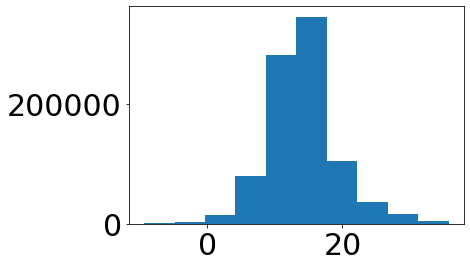

In [17]:
### Convert ra ~360 to negative

new_gaia_ra = []
for i in range(len(smc_gaia['ra'])):
    if smc_gaia['ra'][i]>180.:
        new_gaia_ra.append(smc_gaia['ra'][i]-360.)
    else:
        new_gaia_ra.append(smc_gaia['ra'][i]) 
plt.hist(new_gaia_ra)

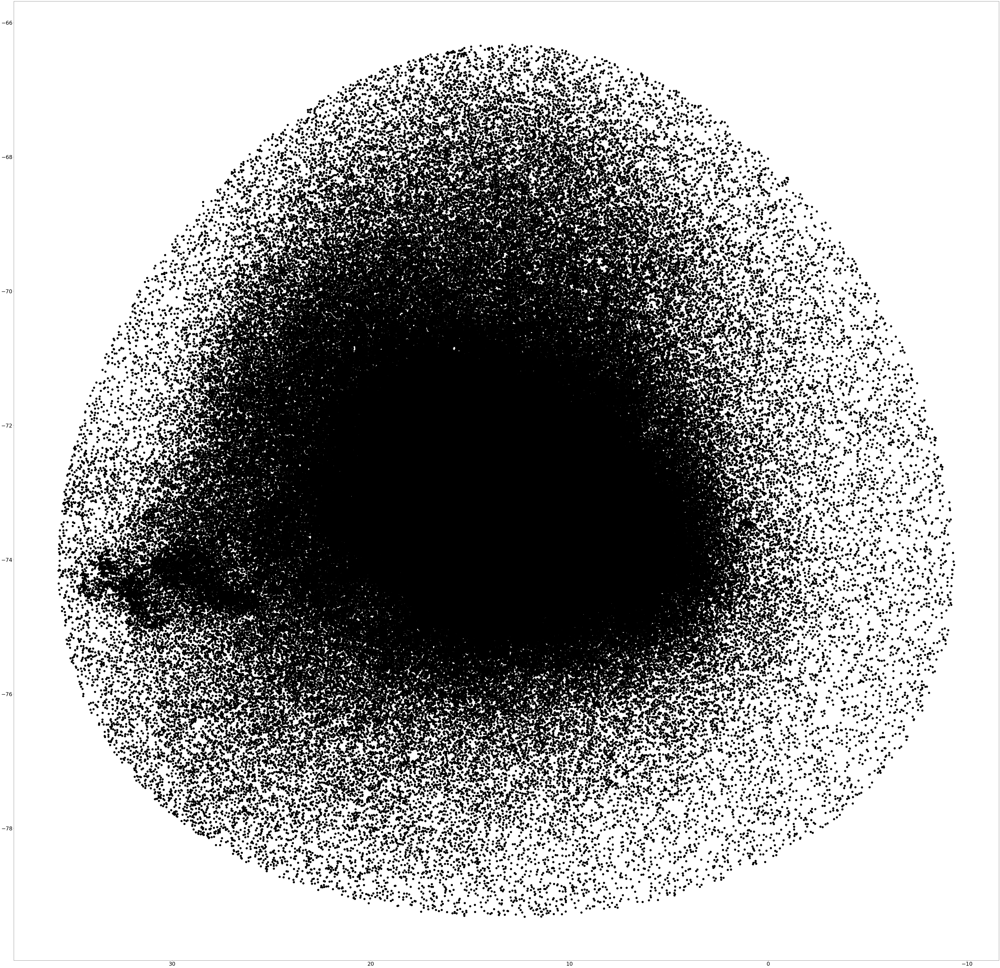

In [18]:
plt.figure(figsize=[100,100])
plt.quiver(new_gaia_ra,smc_gaia['dec'],smc_gaia['pmra'],smc_gaia['pmdec'])
plt.gca().invert_xaxis()

In [19]:
len(new_gaia_ra)

885274

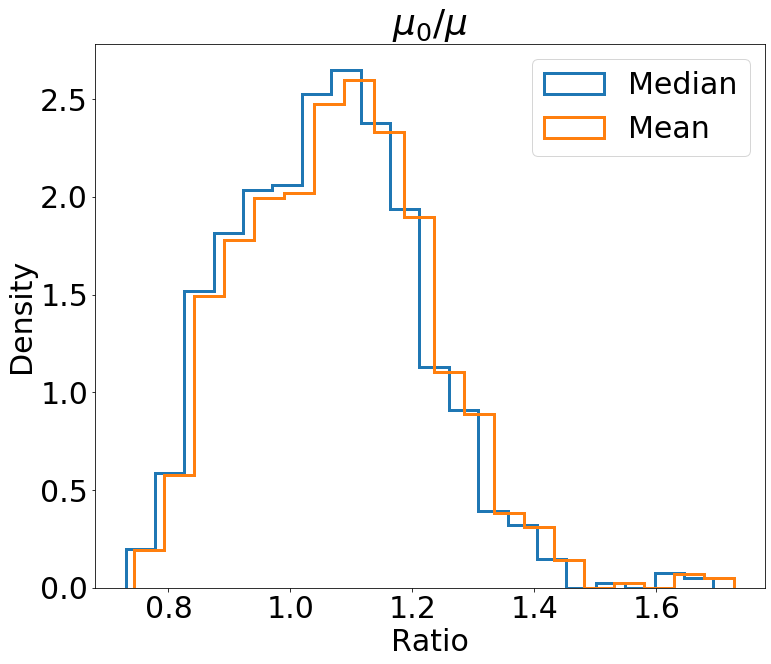

In [20]:
pmmag = np.sqrt(smc_nobloop['GAIA_PMRA']**2+smc_nobloop['GAIA_PMDEC']**2)
rc_pmmag = np.sqrt(rc_gaia['pmra']**2+rc_gaia['pmdec']**2)

rc_g_mean = np.mean(rc_gaia['phot_g_mean_mag'])
rc_g_median = np.median(rc_gaia['phot_g_mean_mag'])

plt.figure(figsize=[12,10])
plt.hist(np.nanmedian(rc_pmmag)/pmmag,bins=20,density=True,histtype='step',label='Median',lw='3.0')
plt.hist(np.nanmean(rc_pmmag)/pmmag,bins=20,density=True,histtype='step',label='Mean',lw='3.0')

plt.title(r'$\mu_0/\mu$')
plt.xlabel(r'Ratio')
plt.ylabel(r'Density')
plt.legend()
plt.show()

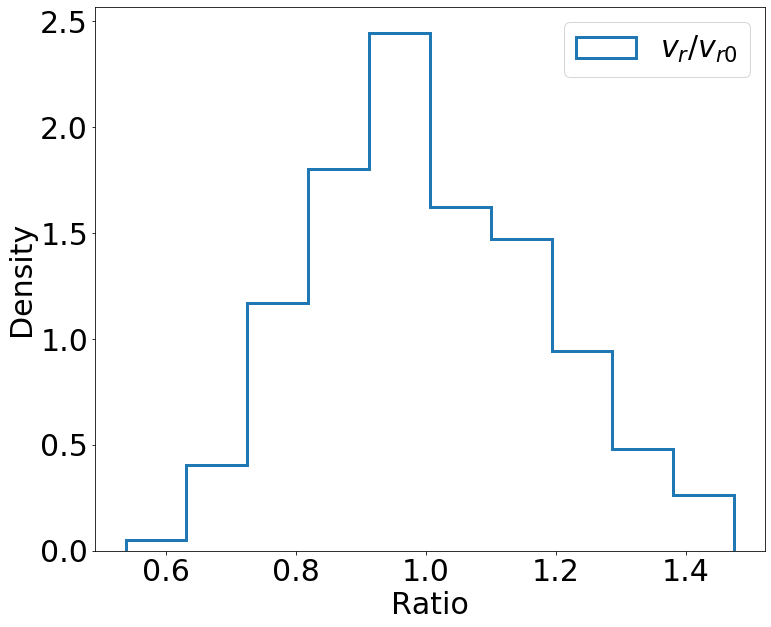

In [21]:
plt.figure(figsize=[12,10])
plt.hist((smc_nobloop['VHELIO_AVG']/145.6),density=True,histtype='step',lw=3.0,label=r'$v_{r}/v_{r0}$')

# plt.title(r'$v/v_0$')
plt.xlabel(r'Ratio')
plt.ylabel(r'Density')
plt.legend()
plt.show()


# radial velocity from 

# @ARTICLE{2018ApJ...864...55Z,
#        author = {{Zivick}, Paul and {Kallivayalil}, Nitya and {van der Marel}, Roeland
#          P. and {Besla}, Gurtina and {Linden}, Sean T. and
#          {Koz{\l}owski}, Szymon and {Fritz}, Tobias K. and {Kochanek}, C.~S. and
#          {Anderson}, J. and {Sohn}, Sangmo Tony and {Geha}, Marla C. and
#          {Alcock}, Charles R.},
#         title = "{The Proper Motion Field of the Small Magellanic Cloud: Kinematic Evidence for Its Tidal Disruption}",
#       journal = {\apj},
#      keywords = {galaxies: individual: Small Magellanic Cloud, galaxies: interactions, galaxies: kinematics and dynamics, Magellanic Clouds, proper motions, Astrophysics - Astrophysics of Galaxies},
#          year = 2018,
#         month = sep,
#        volume = {864},
#        number = {1},
#           eid = {55},
#         pages = {55},
#           doi = {10.3847/1538-4357/aad4b0},
# archivePrefix = {arXiv},
#        eprint = {1804.04110},
#  primaryClass = {astro-ph.GA},
#        adsurl = {https://ui.adsabs.harvard.edu/abs/2018ApJ...864...55Z},
#       adsnote = {Provided by the SAO/NASA Astrophysics Data System}
# }

Text(0, 0.5, 'Density')

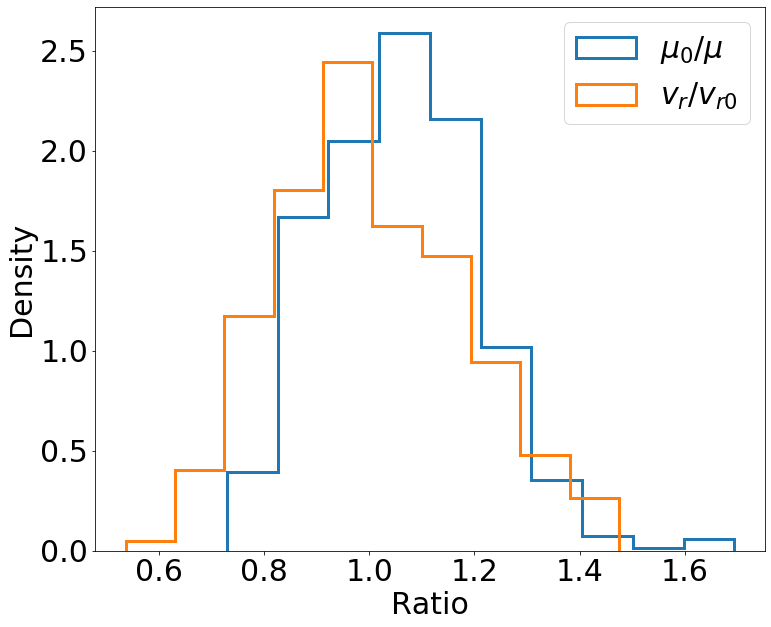

In [22]:
plt.figure(figsize=[12,10])
plt.hist(np.nanmedian(rc_pmmag)/pmmag,density=True,histtype='step',lw=3.0,label=r'$\mu_{0}/\mu$')
plt.hist((smc_nobloop['VHELIO_AVG']/145.6),density=True,histtype='step',lw=3.0,label=r'$v_{r}/v_{r0}$')
plt.legend()

plt.xlabel(r'Ratio')
plt.ylabel(r'Density')

Text(0, 0.5, 'Density')

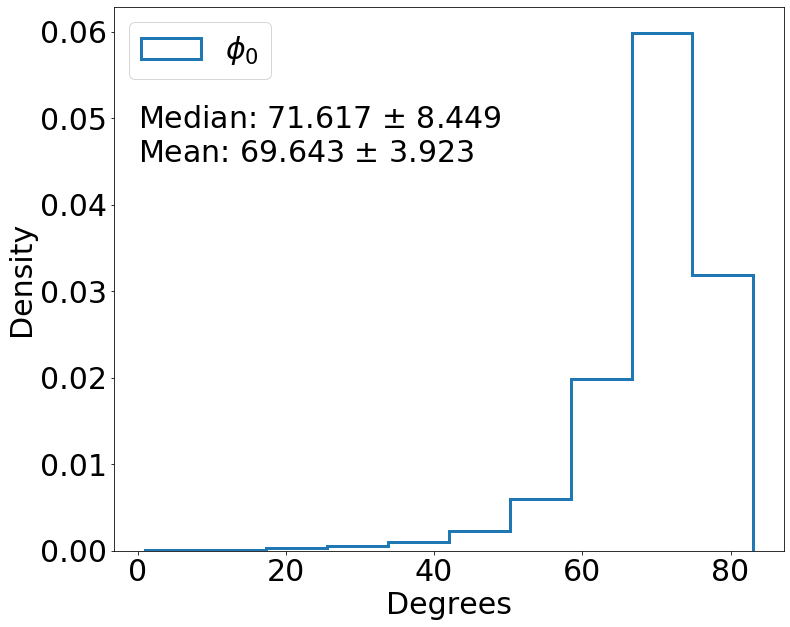

In [23]:
# Assume rc dist of 60 kpc

phi0 = np.degrees(np.arctan((60*4.74*rc_pmmag)/145.6))

plt.figure(figsize=[12,10])
plt.hist(phi0,density=True,histtype='step',lw=3.0,label=r'$\phi_{0}$')
# plt.hist((smc['VHELIO_AVG']/148),density=True,histtype='step',lw=3.0,label=r'$v_{r}/v_{r0}$')
plt.legend(loc='upper left')

plt.text(0,0.045,
         'Median: {:.3f} $\pm$ {:.3f}\nMean: {:.3f} $\pm$ {:.3f}'.format(np.nanmedian(phi0),np.nanstd(phi0),
                                                                         np.nanmean(phi0),util.mad(phi0)))

plt.xlabel(r'Degrees')
plt.ylabel(r'Density')

Text(0, 0.5, 'Density')

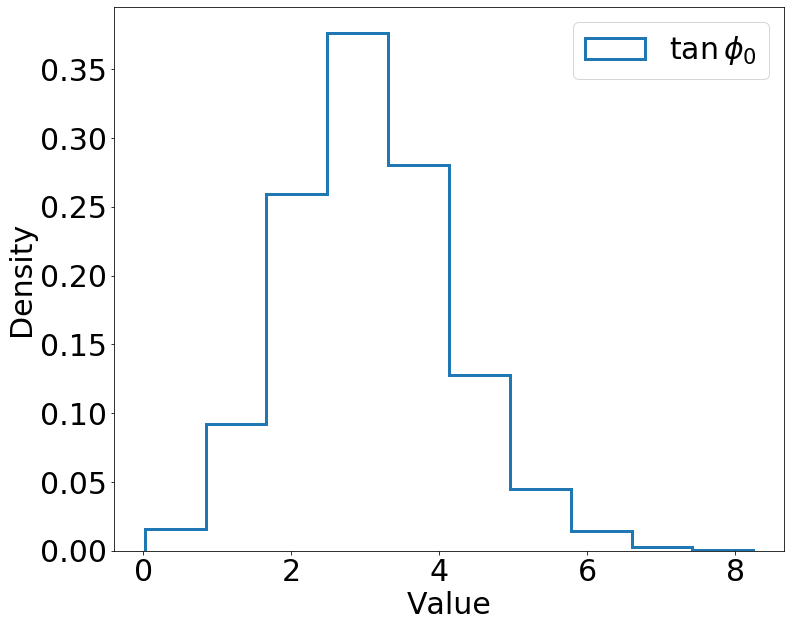

In [24]:
plt.figure(figsize=[12,10])
plt.hist(np.tan(np.radians(phi0)),density=True,histtype='step',lw=3.0,label=r'$\tan{\, \phi_0 }$')
# plt.hist((smc['VHELIO_AVG']/148),density=True,histtype='step',lw=3.0,label=r'$v_{r}/v_{r0}$')
plt.legend(loc='upper right')

plt.xlabel(r'Value')
plt.ylabel(r'Density')

Text(0, 0.5, 'Density')

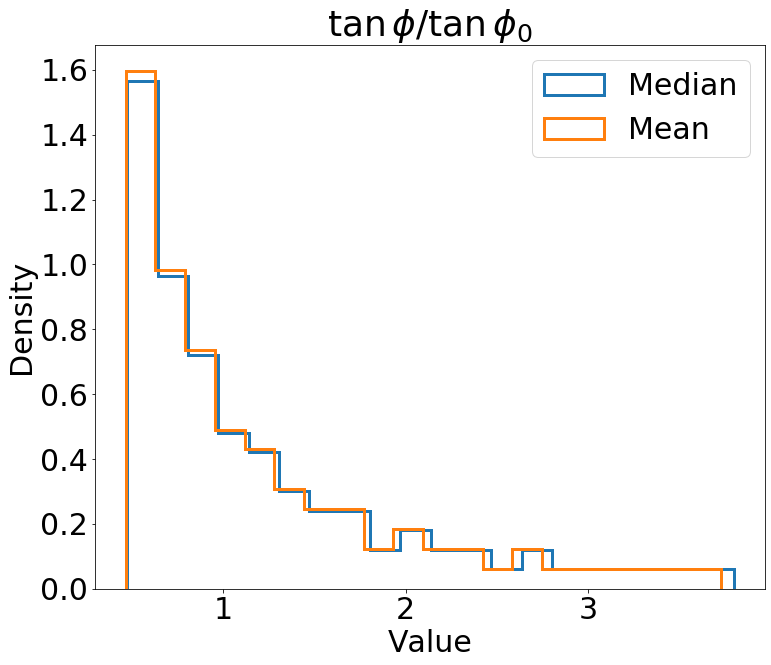

In [25]:
angles = np.linspace(np.radians(55),np.radians(85),100)

plt.figure(figsize=[12,10])
plt.hist(np.tan(angles)/np.median(np.tan(np.radians(phi0))),bins=20,density=True,histtype='step',lw=3.0,label='Median')
plt.hist(np.tan(angles)/np.mean(np.tan(np.radians(phi0))),bins=20,density=True,histtype='step',lw=3.0,label='Mean')
plt.legend(loc='upper right')

plt.title(r'$\tan{\, \phi}/\tan{\, \phi_0}$')
plt.xlabel(r'Value')
plt.ylabel(r'Density')

In [26]:
print(np.median(np.tan(angles)/np.median(np.tan(np.radians(phi0)))))
print(np.mean(np.tan(angles)/np.median(np.tan(np.radians(phi0)))))

0.9131186137029104
1.2054932476527895


In [27]:
rc_gaia.columns

ColDefs(
    name = 'solution_id'; format = 'K'
    name = 'designation'; format = '28A'
    name = 'source_id'; format = 'K'
    name = 'random_index'; format = 'K'
    name = 'ref_epoch'; format = 'D'; unit = 'yr'
    name = 'ra'; format = 'D'; unit = 'deg'
    name = 'ra_error'; format = 'D'; unit = 'mas'
    name = 'dec'; format = 'D'; unit = 'deg'
    name = 'dec_error'; format = 'D'; unit = 'mas'
    name = 'parallax'; format = 'D'; unit = 'mas'
    name = 'parallax_error'; format = 'D'; unit = 'mas'
    name = 'parallax_over_error'; format = 'E'
    name = 'pmra'; format = 'D'; unit = 'mas.yr**-1'
    name = 'pmra_error'; format = 'D'; unit = 'mas.yr**-1'
    name = 'pmdec'; format = 'D'; unit = 'mas.yr**-1'
    name = 'pmdec_error'; format = 'D'; unit = 'mas.yr**-1'
    name = 'ra_dec_corr'; format = 'E'
    name = 'ra_parallax_corr'; format = 'E'
    name = 'ra_pmra_corr'; format = 'E'
    name = 'ra_pmdec_corr'; format = 'E'
    name = 'dec_parallax_corr'; format = 'E'
    na

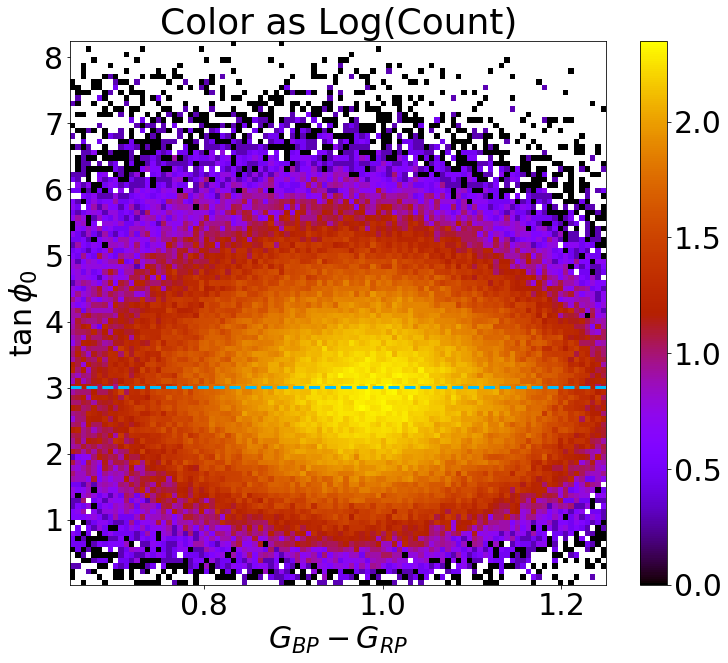

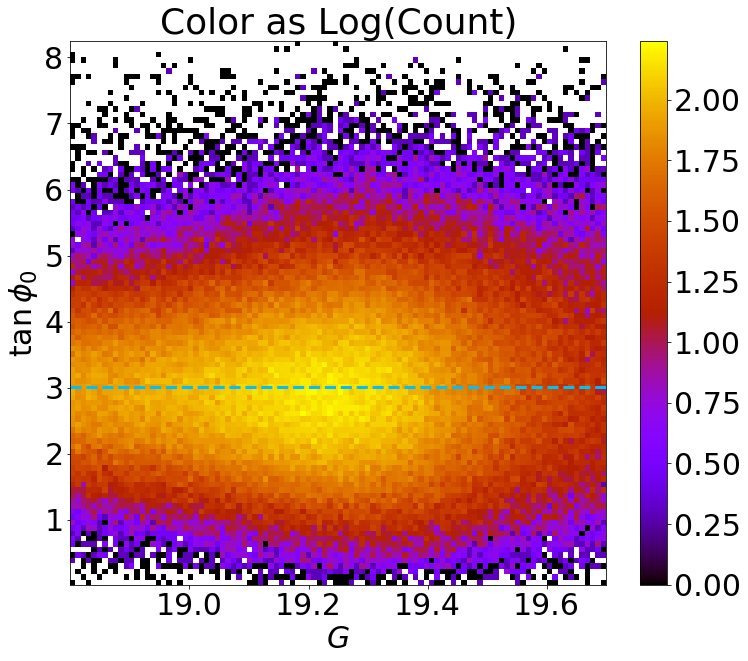

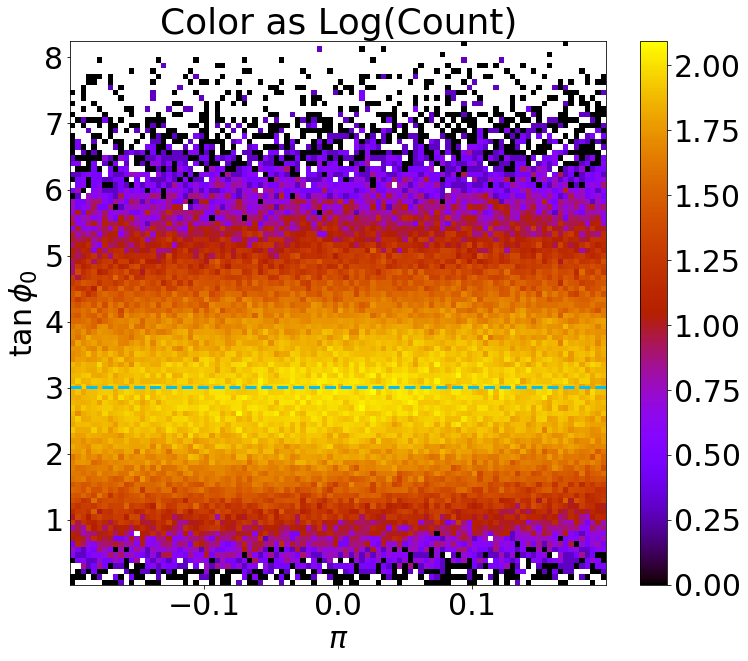

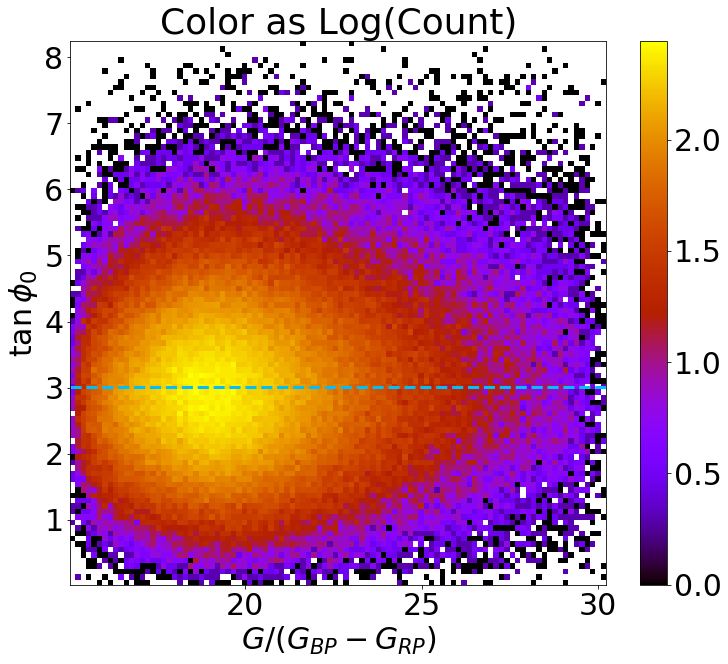

In [28]:
Ngbprpphi = binned_statistic_2d(x=rc_gaia['bp_rp'],y=np.tan(np.radians(phi0)),
                        values=rc_gaia['bp_rp'],statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Ngbprpphi.statistic.T),origin='lower',
           extent=[Ngbprpphi.x_edge[0],Ngbprpphi.x_edge[-1],Ngbprpphi.y_edge[0],Ngbprpphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$G_{BP} - G_{RP}$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

###f
Ngphi = binned_statistic_2d(x=rc_gaia['phot_g_mean_mag'],y=np.tan(np.radians(phi0)),
                        values=rc_gaia['phot_g_mean_mag'],statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Ngphi.statistic.T),origin='lower',
           extent=[Ngphi.x_edge[0],Ngphi.x_edge[-1],Ngphi.y_edge[0],Ngphi.y_edge[-1]],aspect='auto',
           interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$G$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

###
Nparaphi = binned_statistic_2d(x=rc_gaia['parallax'],y=np.tan(np.radians(phi0)),
                        values=rc_gaia['parallax'],statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Nparaphi.statistic.T),origin='lower',
           extent=[Nparaphi.x_edge[0],Nparaphi.x_edge[-1],Nparaphi.y_edge[0],Nparaphi.y_edge[-1]],aspect='auto',
           interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\pi$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

###
Nweirdphi = binned_statistic_2d(x=np.divide(rc_gaia['phot_g_mean_mag'],rc_gaia['bp_rp']),
                               y=np.tan(np.radians(phi0)),
                               values=np.divide(rc_gaia['phot_g_mean_mag'],rc_gaia['bp_rp']),
                               statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Nweirdphi.statistic.T),origin='lower',
           extent=[Nweirdphi.x_edge[0],Nweirdphi.x_edge[-1],Nweirdphi.y_edge[0],Nweirdphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$G/(G_{BP} - G_{RP})$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

(array([  299.,  1045.,  6565., 34175., 94910., 97380., 32809., 11483.,
         3759.,   750.]),
 array([-9.3226298 , -4.82536925, -0.3281087 ,  4.16915184,  8.66641239,
        13.16367294, 17.66093348, 22.15819403, 26.65545458, 31.15271512,
        35.64997567]),
 <a list of 10 Patch objects>)

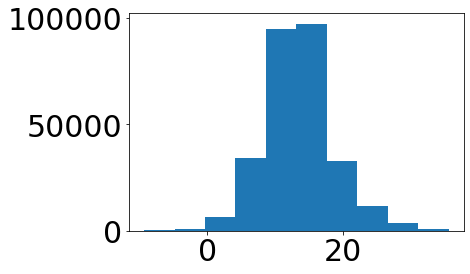

In [29]:
### Convert ra ~360 to negative

new_rc_gaia_ra = []
for i in range(len(rc_gaia['ra'])):
    if rc_gaia['ra'][i]>180.:
        new_rc_gaia_ra.append(rc_gaia['ra'][i]-360.)
    else:
        new_rc_gaia_ra.append(rc_gaia['ra'][i]) 
plt.hist(new_rc_gaia_ra)

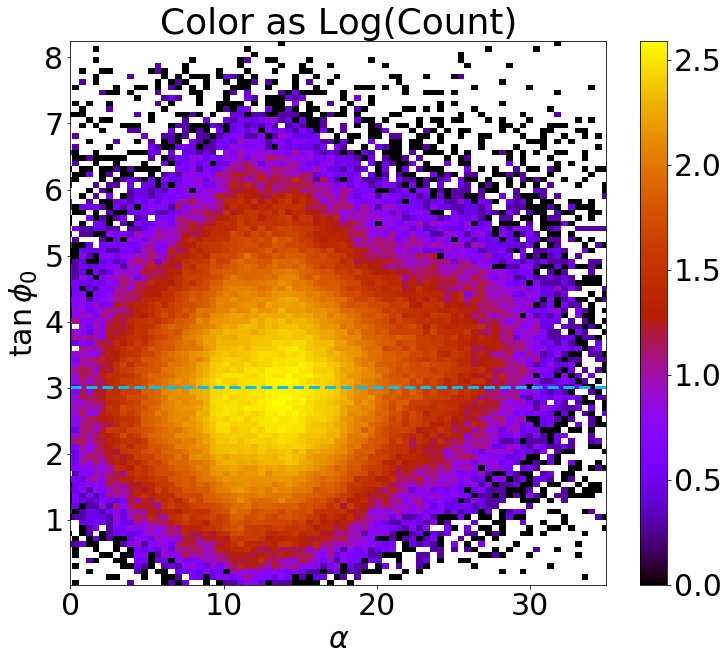

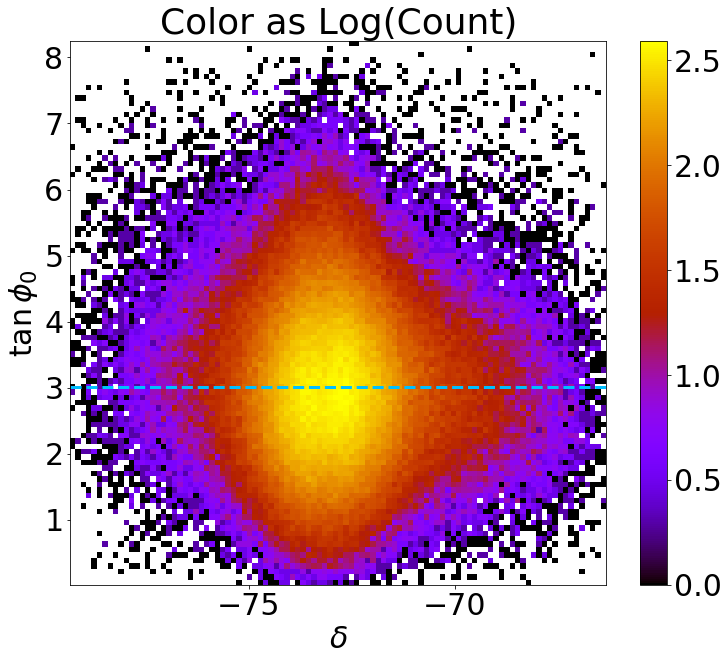

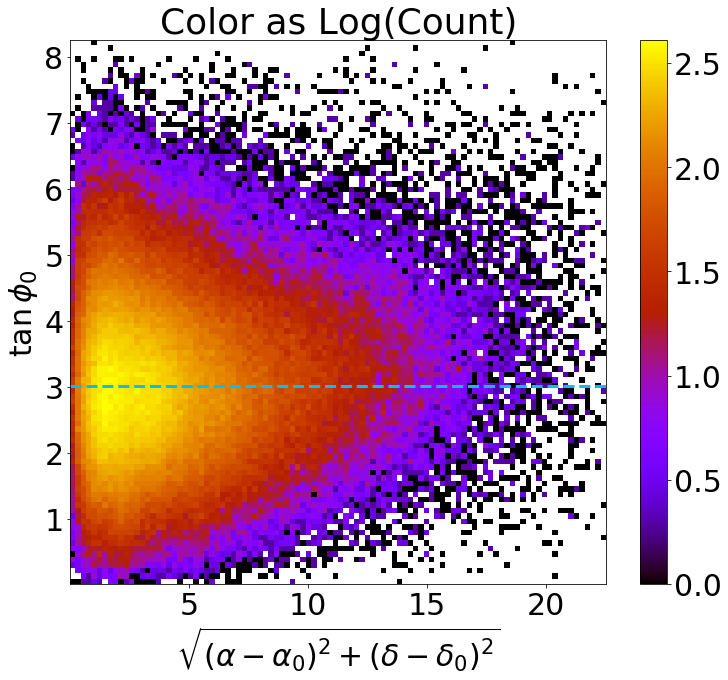

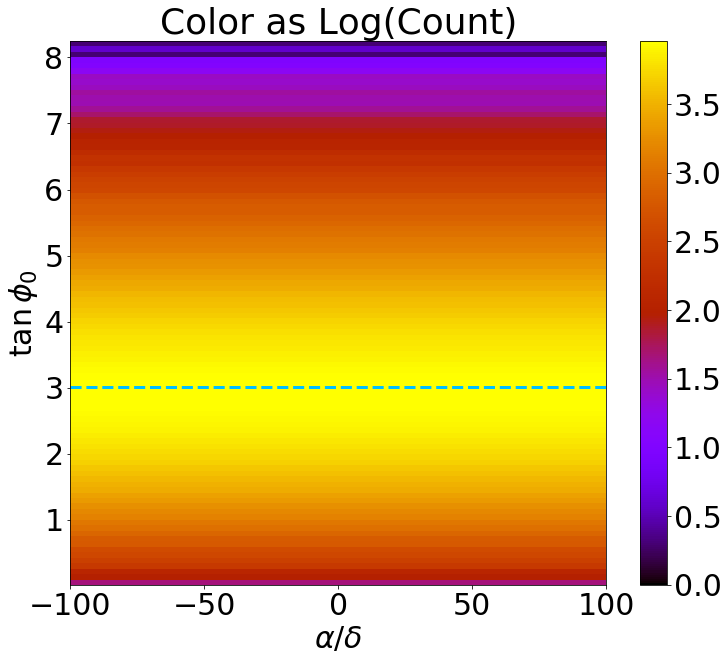

In [30]:
###
Nraphi = binned_statistic_2d(x=new_rc_gaia_ra,y=np.tan(np.radians(phi0)),values=new_rc_gaia_ra,
                             statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Nraphi.statistic.T),origin='lower',
           extent=[Nraphi.x_edge[0],Nraphi.x_edge[-1],Nraphi.y_edge[0],Nraphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.xlim(0,35)

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

###
Ndecphi = binned_statistic_2d(x=rc_gaia['dec'],y=np.tan(np.radians(phi0)),values=rc_gaia['dec'],
                             statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Ndecphi.statistic.T),origin='lower',
           extent=[Ndecphi.x_edge[0],Ndecphi.x_edge[-1],Ndecphi.y_edge[0],Ndecphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\delta$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

### 13.18333333, -72.82833333
from_cen = np.sqrt(np.subtract(new_rc_gaia_ra,13.18333333)**2+np.add(rc_gaia['dec'],72.82833333)**2)

Nradphi = binned_statistic_2d(x=from_cen,y=np.tan(np.radians(phi0)),values=from_cen,
                             statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Nradphi.statistic.T),origin='lower',
           extent=[Nradphi.x_edge[0],Nradphi.x_edge[-1],Nradphi.y_edge[0],Nradphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\sqrt{(\alpha - \alpha_0)^2+(\delta - \delta_0)^2}$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

### 
# from_cen = np.sqrt(np.subtract(new_rc_gaia_ra,13.18333333)**2+np.add(rc_gaia['dec'],72.82833333)**2)

Nratphi = binned_statistic_2d(x=np.divide(rc_gaia['dec'],new_rc_gaia_ra),y=np.tan(np.radians(phi0)),
                              values=np.divide(rc_gaia['dec'],new_rc_gaia_ra),statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Nratphi.statistic.T),origin='lower',
           extent=[Nratphi.x_edge[0],Nratphi.x_edge[-1],Nratphi.y_edge[0],Nratphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.xlim(-100,100)

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\alpha / \delta$')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

In [31]:
# plt.figure(figsize=[12,10])
# plt.scatter(new_rc_gaia_ra,rc_gaia['dec'],c=np.tan(np.radians(phi0)),cmap='nipy_spectral')
# plt.colorbar()

# plt.title(r'Color as $\tan{\, \phi_0}$')
# plt.xlabel(r'$\alpha$')
# plt.ylabel(r'$\delta$')

# plt.show()

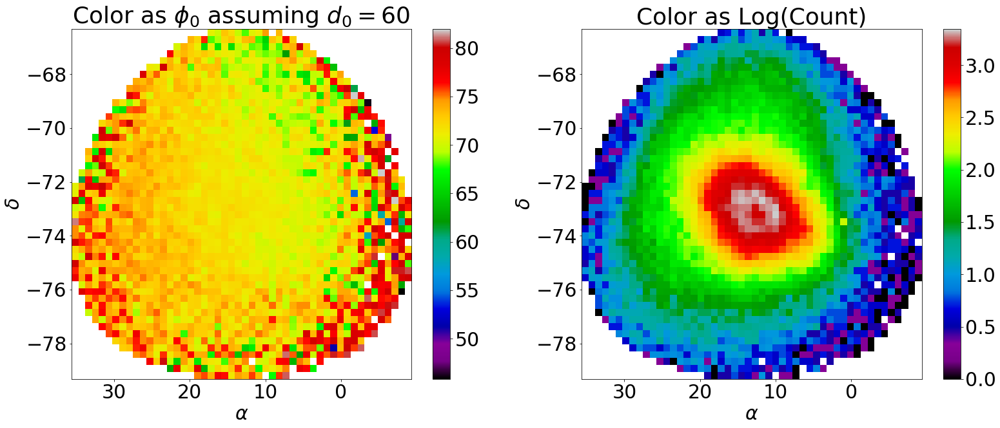

In [32]:
Nradecphi = binned_statistic_2d(x=new_rc_gaia_ra,y=rc_gaia['dec'],values=phi0,
                                statistic='median',bins=50)

Nradecn = binned_statistic_2d(x=new_rc_gaia_ra,y=rc_gaia['dec'],values=np.tan(np.radians(phi0)),
                                statistic='count',bins=50)

plt.figure(figsize=[26,10])
plt.subplot(121)
plt.imshow(Nradecphi.statistic.T,origin='lower',
           extent=[Nradecphi.x_edge[0],Nradecphi.x_edge[-1],Nradecphi.y_edge[0],Nradecphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='nipy_spectral')
plt.colorbar()

plt.gca().invert_xaxis()

plt.title(r'Color as $\phi_0$ assuming $d_0 = 60$')# as $\tan{\, \phi_0}$')
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\delta$')

plt.subplot(122)
plt.imshow(np.log10(Nradecn.statistic.T),origin='lower',
           extent=[Nradecn.x_edge[0],Nradecn.x_edge[-1],Nradecn.y_edge[0],Nradecn.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='nipy_spectral')
plt.colorbar()

# plt.scatter(smc['ra'],smc['dec'],c='k')

plt.gca().invert_xaxis()

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\delta$')

plt.show()

In [33]:
print(np.degrees(np.arctan(2.5)))
print(np.degrees(np.arctan(3.5)))

68.19859051364818
74.05460409907715


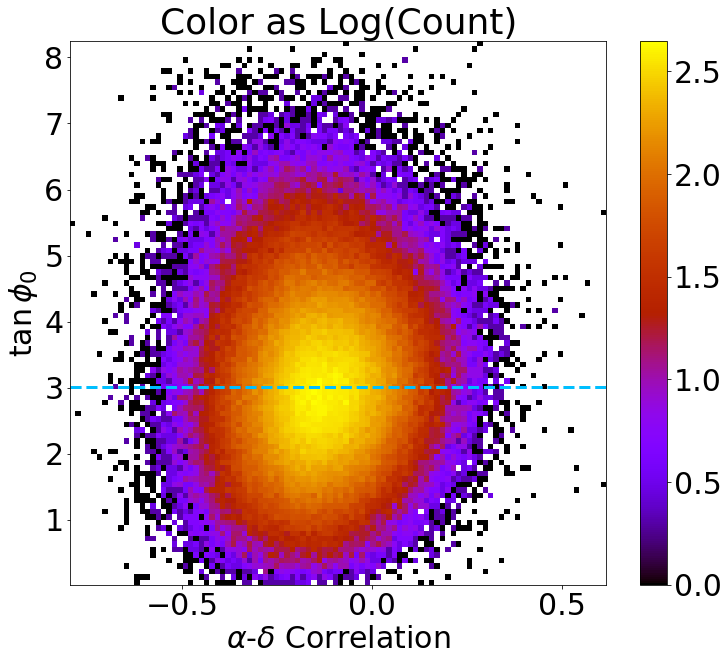

In [34]:
###
Nradecphi = binned_statistic_2d(x=rc_gaia['ra_dec_corr'],y=np.tan(np.radians(phi0)),values=rc_gaia['ra_dec_corr'],
                             statistic='count',bins=100)

plt.figure(figsize=[12,10])
plt.imshow(np.log10(Nradecphi.statistic.T),origin='lower',
           extent=[Nradecphi.x_edge[0],Nradecphi.x_edge[-1],Nradecphi.y_edge[0],Nradecphi.y_edge[-1]],
           aspect='auto',interpolation='nearest',cmap='gnuplot')
plt.colorbar()

plt.axhline(np.nanmedian(np.tan(np.radians(phi0))),ls='--',lw=3.0,c='deepskyblue')

plt.title(r'Color as Log(Count)')
plt.xlabel(r'$\alpha$-$\delta$ Correlation')
plt.ylabel(r'$\tan{ \, \phi_0}$')

plt.show()

In [35]:
### Individual APOGEE Fields

tuc47 = np.where(smc['FIELD']=='47TUC')
tuc47 = smc[tuc47]

n362 = np.where(smc['FIELD']=='N362')
n362 = smc[n362]

smc1 = np.where(smc['FIELD']=='SMC1')
smc1 = smc[smc1]

smc2 = np.where(smc['FIELD']=='SMC2')
smc2 = smc[smc2]

smc3 = np.where(smc['FIELD']=='SMC3')
smc3 = smc[smc3]

smc4 = np.where(smc['FIELD']=='SMC4')
smc4 = smc[smc4]

smc5 = np.where(smc['FIELD']=='SMC5')
smc5 = smc[smc5]

smc6 = np.where(smc['FIELD']=='SMC6')
smc6 = smc[smc6]

smc7 = np.where(smc['FIELD']=='SMC7')
smc7 = smc[smc7]

In [36]:
#########################
### Distance Function ###
#########################

def find_dist(mu,vr,d0,mu0,vr0):
    '''
    Calculate the kinematic distance to a star
    
    Inputs:
    ------
        mu: proper motion magnitude
        vr: radial velocity
        d0: ref distance
        mu0: ref proper motion magnitude in units of mu
        vr0: ref radial velocity in units of vr
        
    Output:
    ------
        d: distance to star in the same units of d0
    '''
    
    d = d0*np.divide(mu0,mu)*np.divide(vr,vr0)
    
    return d

def kine_dist(mu,vr):
    '''
    Calculate the kinematic distance to a star
    
    Inputs:
    ------
        mu: proper motion magnitude
        vr: radial velocity
        
    Output:
    ------
        d: distance to star in the same units of d0
    '''
    
    d = np.divide(vr,mu)
    
    return d

def tan_dist(mu,mu0,d0):
    '''
    Calculate the kinematic distance to a star assuming all stars have the same tangential velocity
    
    Inputs:
    ------
        mu: proper motion magnitude
        d0: ref distance
        mu0: ref proper motion magnitude in units of mu
        
    Output:
    ------
        d: distance to star in the same units of d0
    '''
    
    d = d0*np.divide(mu0,mu)
    
    return d

In [48]:
### Calculate the Distances for stars field-by-field

rc_cen = np.where((rc_gaia['ra']>12.68333333)&(rc_gaia['ra']<13.68333333)&
                  (rc_gaia['dec']>-73.32833333)&(rc_gaia['dec']<-72.32833333))

## 62 ## 62.81 from 18.99 dm
dist47 = find_dist(np.sqrt(tuc47['GAIA_PMRA']**2+tuc47['GAIA_PMDEC']**2),tuc47['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist362 = find_dist(np.sqrt(n362['GAIA_PMRA']**2+n362['GAIA_PMDEC']**2),n362['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist1 = find_dist(np.sqrt(smc1['GAIA_PMRA']**2+smc1['GAIA_PMDEC']**2),smc1['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist2 = find_dist(np.sqrt(smc2['GAIA_PMRA']**2+smc2['GAIA_PMDEC']**2),smc2['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist3 = find_dist(np.sqrt(smc3['GAIA_PMRA']**2+smc3['GAIA_PMDEC']**2),smc3['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist4 = find_dist(np.sqrt(smc4['GAIA_PMRA']**2+smc4['GAIA_PMDEC']**2),smc4['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist5 = find_dist(np.sqrt(smc5['GAIA_PMRA']**2+smc5['GAIA_PMDEC']**2),smc5['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist6 = find_dist(np.sqrt(smc6['GAIA_PMRA']**2+smc6['GAIA_PMDEC']**2),smc6['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)
dist7 = find_dist(np.sqrt(smc7['GAIA_PMRA']**2+smc7['GAIA_PMDEC']**2),smc7['VHELIO_AVG'],d0=62,
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),vr0=145.6)

tdist_smc = tan_dist(np.sqrt(smc_nobloop['GAIA_PMRA']**2+smc_nobloop['GAIA_PMDEC']**2),
                     mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)

tdist47 = tan_dist(np.sqrt(tuc47['GAIA_PMRA']**2+tuc47['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist362 = tan_dist(np.sqrt(n362['GAIA_PMRA']**2+n362['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist1 = tan_dist(np.sqrt(smc1['GAIA_PMRA']**2+smc1['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist2 = tan_dist(np.sqrt(smc2['GAIA_PMRA']**2+smc2['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist3 = tan_dist(np.sqrt(smc3['GAIA_PMRA']**2+smc3['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist4 = tan_dist(np.sqrt(smc4['GAIA_PMRA']**2+smc4['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist5 = tan_dist(np.sqrt(smc5['GAIA_PMRA']**2+smc5['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist6 = tan_dist(np.sqrt(smc6['GAIA_PMRA']**2+smc6['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)
tdist7 = tan_dist(np.sqrt(smc7['GAIA_PMRA']**2+smc7['GAIA_PMDEC']**2),
                   mu0=np.nanmedian(rc_pmmag[rc_cen]),d0=62)

In [38]:
kdist47 = kine_dist(np.sqrt(tuc47['GAIA_PMRA']**2+tuc47['GAIA_PMDEC']**2),tuc47['VHELIO_AVG'])
kdist362 = kine_dist(np.sqrt(n362['GAIA_PMRA']**2+n362['GAIA_PMDEC']**2),n362['VHELIO_AVG'])
kdist1 = kine_dist(np.sqrt(smc1['GAIA_PMRA']**2+smc1['GAIA_PMDEC']**2),smc1['VHELIO_AVG'])
kdist2 = kine_dist(np.sqrt(smc2['GAIA_PMRA']**2+smc2['GAIA_PMDEC']**2),smc2['VHELIO_AVG'])
kdist3 = kine_dist(np.sqrt(smc3['GAIA_PMRA']**2+smc3['GAIA_PMDEC']**2),smc3['VHELIO_AVG'])
kdist4 = kine_dist(np.sqrt(smc4['GAIA_PMRA']**2+smc4['GAIA_PMDEC']**2),smc4['VHELIO_AVG'])
kdist5 = kine_dist(np.sqrt(smc5['GAIA_PMRA']**2+smc5['GAIA_PMDEC']**2),smc5['VHELIO_AVG'])
kdist6 = kine_dist(np.sqrt(smc6['GAIA_PMRA']**2+smc6['GAIA_PMDEC']**2),smc6['VHELIO_AVG'])
kdist7 = kine_dist(np.sqrt(smc7['GAIA_PMRA']**2+smc7['GAIA_PMDEC']**2),smc7['VHELIO_AVG'])

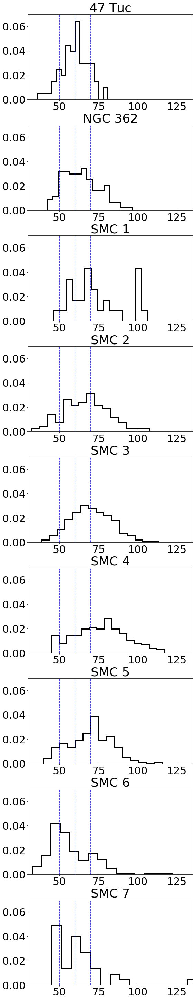

In [39]:
dist_list = [dist47,dist362,dist1,dist2,dist3,dist4,dist5,dist6,dist7]
dist_label = ['47 Tuc','NGC 362','SMC 1','SMC 2','SMC 3','SMC 4','SMC 5','SMC 6','SMC 7']

fig,ax = plt.subplots(9,1,figsize=[8,40])

for i in range(len(ax)):
    ax[i].hist(dist_list[i],density=True,bins=15,histtype='step',lw=3.0,color='k',
               label='{}'.format(dist_label[i]))
    
    ax[i].set_ylim(top=0.07)
    ax[i].set_xlim(30,135)
    
#     ax[i].legend(loc='upper right')
    ax[i].set_title(r'{}'.format(dist_label[i]))
    
    ax[i].axvline(50,ls='--',c='b')
    ax[i].axvline(60,ls='--',c='b')
    ax[i].axvline(70,ls='--',c='b')

plt.tight_layout(pad=0.1)

plt.savefig('disthist.pdf',bbox_inches='tight')
plt.show()

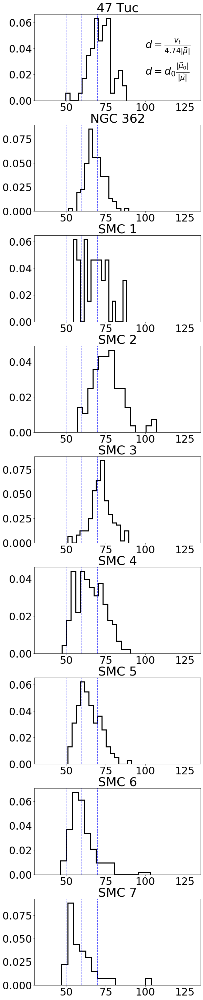

In [42]:
tdist_list = [tdist47,tdist362,tdist1,tdist2,tdist3,tdist4,tdist5,tdist6,tdist7]
tdist_label = ['47 Tuc','NGC 362','SMC 1','SMC 2','SMC 3','SMC 4','SMC 5','SMC 6','SMC 7']

fig,ax = plt.subplots(9,1,figsize=[8,40])

for i in range(len(ax)):
    ax[i].hist(tdist_list[i],density=True,bins=15,histtype='step',lw=3.0,color='k',
               label='{}'.format(tdist_label[i]))
    
#     ax[i].set_ylim(top=0.07)
    ax[i].set_xlim(30,135)
    
#     ax[i].legend(loc='upper right')
    ax[i].set_title(r'{}'.format(tdist_label[i]))
    
    ax[i].axvline(50,ls='--',c='b')
    ax[i].axvline(60,ls='--',c='b')
    ax[i].axvline(70,ls='--',c='b')
    
    if i == 0:
        ax[i].text(100,0.04,r'$d = \frac{v_t}{4.74|\vec{\mu}|}$')
        ax[i].text(100,0.02,r'$d = d_0 \frac{|\vec{\mu}_0|}{|\vec{\mu}|}$')

plt.tight_layout(pad=0.)

plt.savefig('tdisthist.pdf',bbox_inches='tight')
plt.show()

<font size='45'>
    <b>
        Ages
    </b>
</font>

In [43]:
def find_ages(z1,z2,z3):
#good good
    # #     x1,x2,x3,x12,x13,x23,x1sq,x2sq,x3sq,x2cu
#     p = [9.38559303e+00,4.50640684e-02,-6.04245546e-02,-2.97525149e+00,1.89919586e-02,-5.42190398e-02,
#          1.09839708e-01,-5.88914872e-03,2.50980954e-02,8.74102230e-01,2.28289124e-02]
#     age = (p[0]+p[1]*z1+p[2]*z2+p[3]*z3+p[4]*np.multiply(z1,z2)+p[5]*np.multiply(z1,z3)+p[6]*np.multiply(z2,z3)+
#            p[7]*(z1**2)+p[8]*(z2**2)+p[9]*(z3**2)+p[10]*(z2**3))
    
    #x1,x2,x3,x12,x13,x23,x1sq,x2sq,x3sq,x2cu,x3cu
    p = [9.38631710e+00,4.57009017e-02,-5.98198867e-02,-2.99642242e+00,1.86921027e-02,-4.51165023e-02,
         1.10829968e-01,-5.93377185e-03,2.51457473e-02,7.98522275e-01,2.26643514e-02,4.00941011e-01]
    age = (p[0]+p[1]*z1+p[2]*z2+p[3]*z3+p[4]*np.multiply(z1,z2)+p[5]*np.multiply(z1,z3)+p[6]*np.multiply(z2,z3)+
           p[7]*(z1**2)+p[8]*(z2**2)+p[9]*(z3**2)+p[10]*(z2**3)+p[11]*(z3**3))

    return age

#calculate absolute mag
def absmag(magnitude,distance):
    '''
    - magnitude: apparent magnitude of star
    - distance: distance to star in kpc
    Calculate the absolute magnitude of star
    '''
    absm = []
    absm.append(magnitude-5.0*np.log10(distance*1000)+5.0)
    absm = np.squeeze(np.array(absm))
    return absm

def sal(MH,aM):
    '''
    Calculate the Salaris correction to the overall metallicity
    '''
    return MH + np.log(0.638*(10**(aM))+0.362)

In [44]:
### Get Solar Fractions
abd = {'C':8.39,'N':7.78,'O':8.66,'Mg':7.53,'Ca':6.31,'S':7.14,'Si':7.51,'Fe':7.45}
keys = list(abd.keys())

sol_2_H = []
for i in keys:
    sol_2_H.append(abd[i]-12.0)
    
sol_xm  = 10**np.asarray(sol_2_H)/sum(10**np.asarray(sol_2_H))

In [58]:
### PCA
from sklearn.decomposition import PCA, KernelPCA

age_dist = []

data = np.array([parsec['logTe'],parsec['Ksmag'],parsec['MH'],parsec['logg']]).T
pca_transform = PCA(n_components=3).fit(data)

for i in tqdm_notebook(range(len(smc_nobloop)),desc='Done?'):
    
    # temperature
    teff = smc_nobloop['TEFF'][i]
    teff_err = smc_nobloop['TEFF_ERR'][i]
    
    # photometry 
    ra = smc_nobloop['RA'][i]
    dec = smc_nobloop['DEC'][i]
    ks = smc_nobloop['K'][i]
    ks_err = smc_nobloop['K_ERR'][i]
    ak = smc_nobloop['AK_TARG'][i]
    distance = tdist_smc[i]
#     distance_err = dis_err[i]/1000.
    
    # abundances
    mh = smc_nobloop['M_H'][i]
    mh_err = smc_nobloop['M_H_ERR'][i]
    cfe = smc_nobloop['C_FE'][i]
    cfe_err = smc_nobloop['C_FE_ERR'][i]
    nfe = smc_nobloop['N_FE'][i]
    nfe_err = smc_nobloop['N_FE_ERR'][i]
    feh = smc_nobloop['FE_H'][i]
    feh_err = smc_nobloop['FE_H_ERR'][i]
    
    # surface gravity
    lgg = smc_nobloop['LOGG'][i]
    lgg_err = smc_nobloop['LOGG_ERR'][i]
    
    noise_ages = []
    new = []
    for j in range(750):
       
        # calculate noisy temperature
        teff_new = util.add_noise(teff,teff_err) 
        lgteff_new = np.log10(teff_new)
    
        # Calculate noisy K magnitude
#         _, _, dist = afunc.LMCdisk_cart(ra,dec)

        dist_new = 60 #distance #util.add_noise(distance,distance_err)
        
        ks_new = util.add_noise(ks,ks_err)
            
        absK_new = absmag(ks_new,dist_new) - ak
            
        # Calculate noisy Salaris correction
        
        x_C_new = sol_xm[0]*10**(util.add_noise(cfe,cfe_err)+
                                 util.add_noise(feh,feh_err)-util.add_noise(mh,mh_err))
        x_N_new = sol_xm[1]*10**(util.add_noise(nfe,nfe_err)+
                                 util.add_noise(feh,feh_err)-util.add_noise(mh,mh_err))
        
        ffac_new = (x_C_new+x_N_new)/sum(sol_xm[0:2])
        
        mh_new = util.add_noise(mh,mh_err)
        
        # Calculate noisy surface gravity
        lgg_new = util.add_noise(lgg,lgg_err)
            
        # calculate noisy age
        new.append(np.array([lgteff_new,absK_new,sal(mh_new,ffac_new),lgg_new]))
        
    zs = pca_transform.transform(np.asarray(np.squeeze(new)))

    for l in range(len(zs)):
        noise_ages.append(find_ages(zs[l][0],zs[l][1],zs[l][2]))
    
    age_dist.append(noise_ages)

parages = [] 
devs = []
for k in tqdm_notebook(range(len(age_dist))):
    devs.append(util.mad(age_dist[k]))
    parages.append(np.median(age_dist[k]))

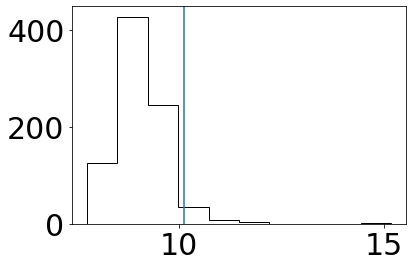

In [59]:
plt.hist(parages,histtype='step',color='k')
plt.axvline(np.log10(ageU))

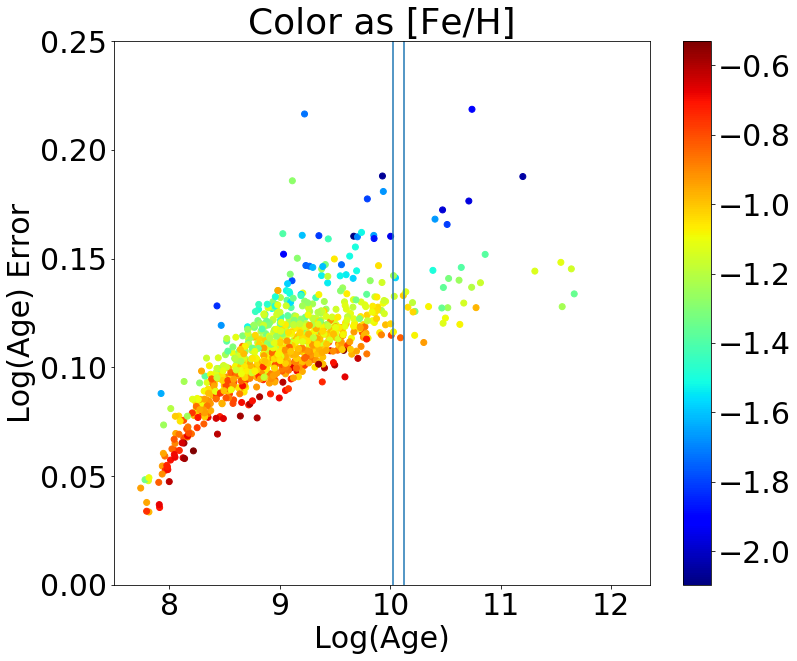

In [61]:
matplotlib.rcParams.update({'font.size': 30})
plt.figure(figsize=[12,10])
plt.scatter(parages,devs,c=smc_nobloop['FE_H'],cmap='jet')
plt.colorbar()

plt.ylim(0,0.25)
plt.xlim(7.5,12.35)

plt.axvline(np.log10(ageU))
plt.axvline(np.log10(10.5*10**9))

plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(Age)')
plt.ylabel(r'Log(Age) Error')

# plt.savefig('age_err.pdf',bbox_inches='tight')
plt.show()

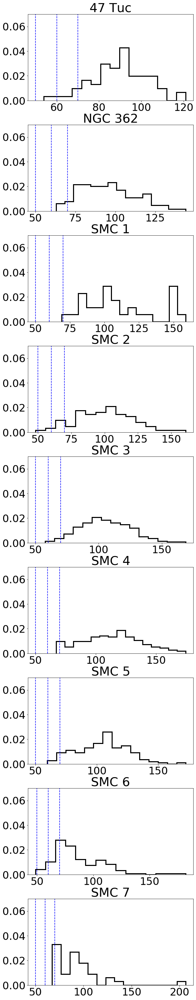

In [41]:
kdist_list = [kdist47,kdist362,kdist1,kdist2,kdist3,kdist4,kdist5,kdist6,kdist7]
kdist_label = ['47 Tuc','NGC 362','SMC 1','SMC 2','SMC 3','SMC 4','SMC 5','SMC 6','SMC 7']

fig,ax = plt.subplots(9,1,figsize=[8,40])

for i in range(len(ax)):
    ax[i].hist(kdist_list[i],density=True,bins=15,histtype='step',lw=3.0,color='k',
               label='{}'.format(kdist_label[i]))
    
    ax[i].set_ylim(top=0.07)
#     ax[i].set_xlim(30,135)
    
#     ax[i].legend(loc='upper right')
    ax[i].set_title(r'{}'.format(kdist_label[i]))
    
    ax[i].axvline(50,ls='--',c='b')
    ax[i].axvline(60,ls='--',c='b')
    ax[i].axvline(70,ls='--',c='b')

plt.tight_layout(pad=0.)

plt.savefig('kdisthist.pdf',bbox_inches='tight')
plt.show()

Text(0, 0.5, 'N')

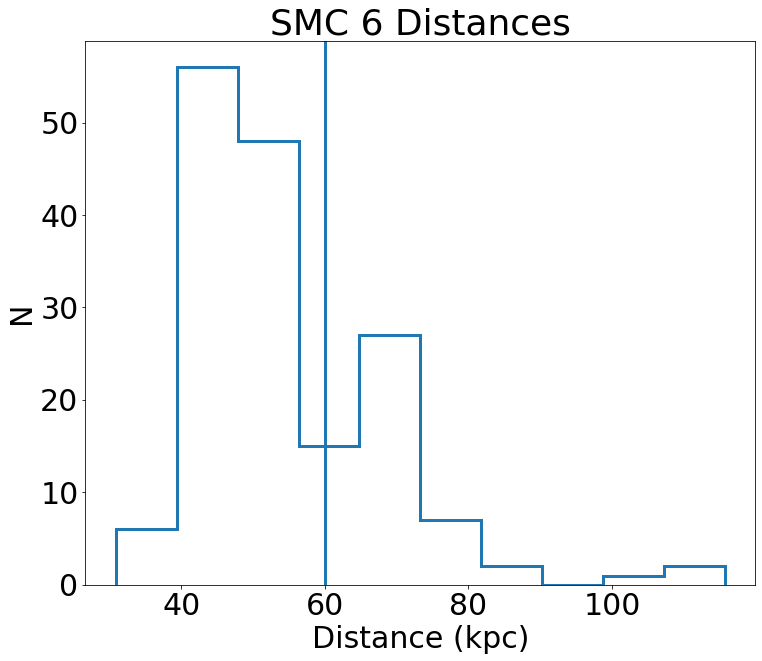

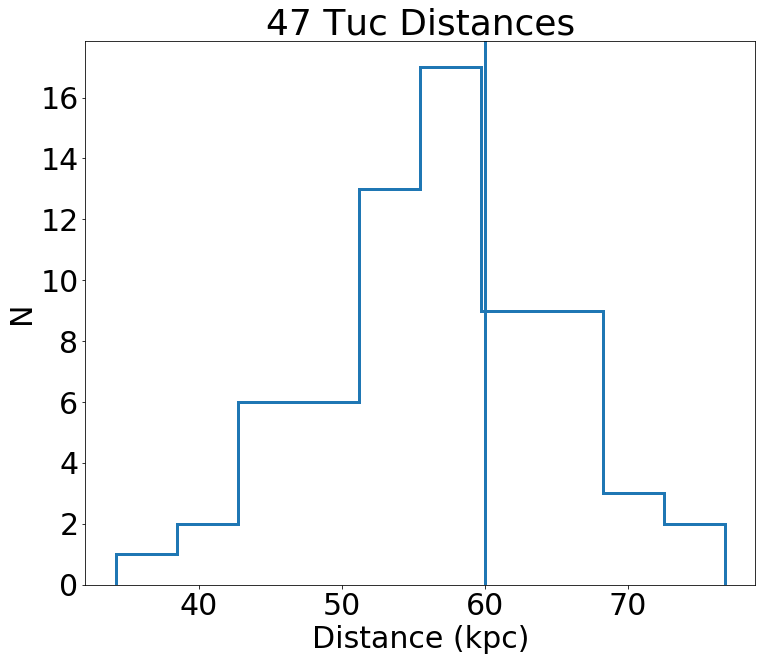

In [40]:
### EAST
east6 = smc[np.where(smc['FIELD']=='SMC6')]

plt.figure(figsize=[12,10])
dist6 = (60*(np.nanmedian(rc_pmmag)/np.sqrt(east6['GAIA_PMRA']**2+east6['GAIA_PMDEC']**2))*
         (east6['VHELIO_AVG']/145.6))

plt.hist(dist6,histtype='step',lw=3.0)
plt.axvline(60,lw=3.0)

plt.title(r'SMC 6 Distances')
plt.xlabel(r'Distance (kpc)')
plt.ylabel(r'N')

### WEST
tuc47 = smc[np.where(smc['FIELD']=='47TUC')]

plt.figure(figsize=[12,10])
dist47 = (60*(np.nanmedian(rc_pmmag)/np.sqrt(tuc47['GAIA_PMRA']**2+tuc47['GAIA_PMDEC']**2))*
         (tuc47['VHELIO_AVG']/145.6))

plt.hist(dist47,histtype='step',lw=3.0)
plt.axvline(60,lw=3.0)

plt.title(r'47 Tuc Distances')
plt.xlabel(r'Distance (kpc)')
plt.ylabel(r'N')

#cent6 = [np.median(east['RA']),np.median(east['DEC'])]

# def circ_xy(x,y,x0,y0):
#     dist = np.sqrt(np.subtract(x,x0)**2+np.subtract(y,y0)**2)
#     return dist

# gaiax = circ_xy(rc_gaia['ra'],rc_gaia['dec'],cent6[0],cent6[1])

# rc_gaia_6 = rc_gaia[np.where(gaiax<=1.0)]

# plt.figure(figsize=[10,10])
# plt.scatter(rc_gaia_6['pmra'],rc_gaia_6['pmdec'])
# plt.scatter(smc['GAIA_PMRA'],smc['GAIA_PMDEC'])
# plt.show()

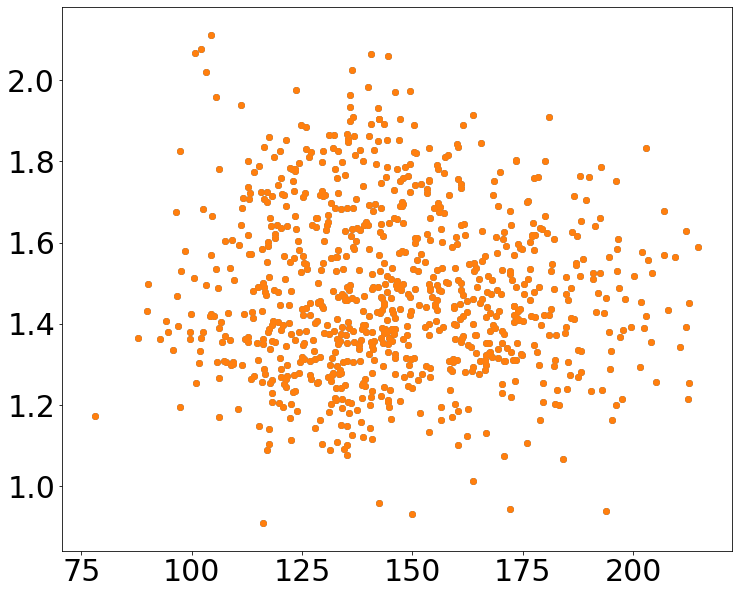

In [46]:
plt.figure(figsize=[12,10])
plt.scatter(smc_nobloop['VHELIO_AVG'],np.sqrt(smc_nobloop['GAIA_PMRA']**2+smc_nobloop['GAIA_PMDEC']**2))
plt.scatter(smc_nobloop['VHELIO_AVG'],np.sqrt(smc_nobloop['GAIA_PML']**2+smc_nobloop['GAIA_PMB']**2))

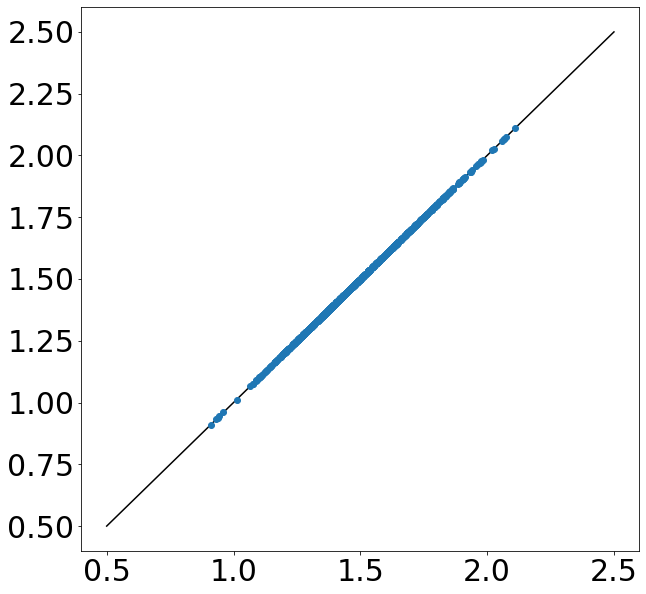

In [122]:
plt.figure(figsize=[10,10])

plt.scatter(np.sqrt(smc_nobloop['GAIA_PMRA']**2+smc_nobloop['GAIA_PMDEC']**2),
            np.sqrt(smc_nobloop['GAIA_PMML']**2+smc_nobloop['GAIA_PMMB']**2),zorder=2)
plt.plot([0.5,2.5],[0.5,2.5],c='k',zorder=1)

(array([  1.,   5.,  16.,  43., 136., 208., 229., 210., 130.,  12.]),
 array([54.02172076, 56.65660292, 59.29148508, 61.92636725, 64.56124941,
        67.19613157, 69.83101373, 72.4658959 , 75.10077806, 77.73566022,
        80.37054238]),
 <a list of 10 Patch objects>)

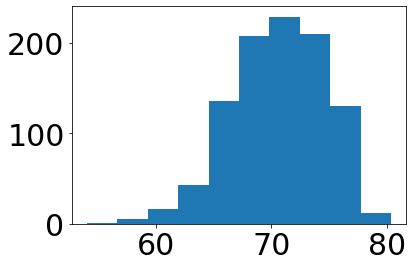

In [154]:
tanphi = 4.74*np.sqrt(smc['GAIA_PMRA']**2+smc['GAIA_PMDEC']**2)*60/smc['VHELIO_AVG']
plt.hist(np.degrees(np.arctan(tanphi)))

In [165]:
(np.median(np.sqrt(smc_nobloop['GAIA_PMRA']**2+smc_nobloop['GAIA_PMDEC']**2))*60./
 np.sqrt(smc_nobloop['GAIA_PMRA']**2+smc_nobloop['GAIA_PMDEC']**2))

array([59.55504385, 62.74662958, 73.08478056, 68.35966691, 64.39686846,
       64.45968825, 55.13945797, 66.62197472, 62.17646682, 62.41814123,
       64.94175717, 58.69147013, 63.59929691, 63.08547603, 66.73539021,
       64.46959117, 62.21763685, 65.30551385, 70.14955592, 64.30876126,
       64.85703506, 65.53044809, 61.37785596, 66.56024378, 58.37213866,
       69.8846439 , 62.51383113, 66.79226221, 64.61739515, 65.76968328,
       64.55677495, 66.32051518, 76.15776846, 63.30706605, 72.35278426,
       70.47647371, 70.69059711, 60.36855202, 80.23403068, 62.96506649,
       67.96588072, 59.02527242, 61.51173677, 80.09521611, 70.22032176,
       61.50488719, 65.89612968, 72.60061212, 64.76261499, 60.68969264,
       75.01290197, 61.97849798, 62.84390914, 63.53769823, 64.07847124,
       63.36543851, 63.69019031, 66.67220281, 67.2849647 , 65.45078297,
       75.38228702, 62.70124919, 59.2867437 , 63.60176818, 62.79199573,
       64.14692561, 59.8723506 , 60.66249826, 73.7618454 , 74.01